# **Projet UA 2 – Classification des Places de Stationnement**:

---




## **Introduction**:

Dans ce projet, vous devrez concevoir, entraîner et évaluer différents modèles de réseaux de neurones convolutifs (CNN) pour classifier l'état de places de stationnement. Vous comparerez trois approches basées sur les concepts vus en classe : un CNN "classique" (construit de zéro), ce même CNN amélioré par l'augmentation des données, et une approche par apprentissage par transfert.

### **Description des données**

•Classe 0 : Occupée


La place de stationnement est clairement occupée par un véhicule (voiture, moto, camion, etc.).

Exemples : Une voiture correctement garée, une moto, etc.


•Classe 1 : Libre

La place de stationnement est vide, légale et utilisable. Les lignes de délimitation sont visibles.

Exemples : Une place vide dans un stationnement de centre commercial, une place de stationnement parallèle vide dans la rue, etc.


Classe 2 : Libre mais non disponible

La place est libre de véhicule, mais elle n'est pas disponible l'utilisée. Elle est identifiée par un symbole, un panneau ou un objet.

Exemples : Une place pour personnes à mobilité réduite (avec le logo au sol ou un panneau visible), une place pour véhicules électriques (avec borne ou marquage vert visible), une place réservée "employé du mois", ou un espace bloqué par un cône ou une chaîne, ou un espace avec un signe "stationnement interdit" visible.

## Les Pré-travaux

In [ ]:
import torch, torchvision
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
import random, numpy as np, torch
import matplotlib.pyplot as plt
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Utilisation de : {device}")

# Reproducibilité
def set_seed(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed()

Utilisation de : cpu


In [ ]:
import tensorflow as tf

# Partie 1 - Chargement et préparation des données

## I - Chargement des images

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Nous allons en premier lieu charger les données et nous assurer de comprendre ce qu'elles représentent.

In [ ]:
import torch
from torch.utils.data import DataLoader, Subset, random_split
from torchvision import datasets, transforms
import os
import numpy as np

from google.colab import drive
drive.mount('/content/drive')

def chargementImages(train_transform, val_transform, test_transform,
                     data_dir="/content/drive/MyDrive/projet /images_V2",
                     train_ratio=0.7, val_ratio=0.15, test_ratio=0.15,
                     batch_size=32):
    """
    Charge un dataset d'images qui contient directement les 3 classes (0,1,2).
    Fait un split train/val/test en mémoire SANS créer de dossiers.
    """

    # 1. Charger tout le dossier avec ImageFolder
    # ce dataset est déjà repartie suivant les classes que ImageFolder a permis de détecter avec les noms des dossiers
    full_dataset = datasets.ImageFolder(root=data_dir, transform=None)

    # 2. Calcul des tailles pour chaque partie
    total_size = len(full_dataset)
    train_size = int(train_ratio * total_size)
    val_size = int(val_ratio * total_size)
    test_size = total_size - train_size - val_size

    print(f"Total images: {total_size} -> Train: {train_size}, Val: {val_size}, Test: {test_size}")

    # 3. Split aléatoire (reproductible car set_seed() est déjà appelé)
    train_dataset, val_dataset, test_dataset = random_split(
        full_dataset,
        [train_size, val_size, test_size]
    )

    # 4. Ajouter les bonnes transformations qui sont dans les paramètres
    train_dataset.dataset.transform = train_transform
    val_dataset.dataset.transform = val_transform
    test_dataset.dataset.transform = test_transform

    # 5. Créer DataLoaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    # 6. Informations à afficher
    print("\n Dataset chargé avec succès depuis :", data_dir)
    print(" Classes détectées :", full_dataset.classes)

    return train_dataset, val_dataset, test_dataset, train_loader, val_loader, test_loader



# 8. Visualiser quelques images
import matplotlib.pyplot as plt
import numpy as np
import torchvision

def imshow_grid(inputs, classes=None, class_names=None, titles=None, nrow=5, figsize=(15,5)):
    batch_size = inputs.size(0)
    ncol = int(np.ceil(batch_size / nrow))

    plt.figure(figsize=figsize)

    for i in range(batch_size):
        plt.subplot(ncol, nrow, i+1)
        img = inputs[i].numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img = std * img + mean
        img = np.clip(img, 0, 1)
        plt.imshow(img)

        if titles is not None:
            plt.title(titles[i], fontsize=10)
        elif classes is not None and class_names is not None:
            plt.title(class_names[classes[i]], fontsize=10)

        plt.axis('off')

    plt.tight_layout()
    plt.show()




Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Nous devons faire la normalisation de nos images en fonction des informations statistiques de notre datasets.
Nous allons trouver la bonne valeur de la moyenne et d'écart type pour normaliser les images.

Important de noter que  ces données sont calculées à partir de la partie d'entrainnement pour éviter la fuite de donnée.

Ainsi nous allons écrire une petite fonction qui prendra en paramètre un dataloader et devra retourner la moyenne et l'écart-type.

In [ ]:
#Cette fonction nous permet de trouver d'obtenir le mean et le std à partir d'un loader d'image
def calcul_mean_std(loader):

    mean = 0.0
    std = 0.0
    total_images = 0

    for images, _ in loader:
        batch_samples = images.size(0)
        images = images.view(batch_samples, images.size(1), -1)  # [B,3,H*W]
        mean += images.mean(2).sum(0)
        std += images.std(2).sum(0)
        total_images += batch_samples

    mean /= total_images
    std /= total_images

    return mean, std


Nous utiliserons la fonction de chargement d'image en appliquant une transformation simple (provisoire) sur nos images, puis obtenir juste la partie train qui sera ensuite utilisée pour le calcul de mean et std afin d'éviter la fuite des données. (la reproductibilité va permettre d'obtenir les mêmes plis en cas d'utilisation finale).

In [ ]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # resize all images to the same size
    transforms.ToTensor()
])

train_dataset,val_dataset,test_dataset, train_loader, val_loader, test_loader=chargementImages(train_transform=transform,
                                                                                               val_transform=transform,
                                                                                               test_transform=transform,
                                                                                               data_dir = "/content/drive/MyDrive/projet /images_V2")

mean, std= calcul_mean_std(train_loader)

Total images: 1165 -> Train: 815, Val: 174, Test: 176

 Dataset chargé avec succès depuis : /content/drive/MyDrive/projet /images_V2
 Classes détectées : ['0', '1', '2']


In [ ]:
mean,std

(tensor([0.4708, 0.4624, 0.4475]), tensor([0.1734, 0.1694, 0.1711]))

Maintenant que nous avons le mean et le std nous allons refaire le chargement finale de nos images.

## II- Transformation des données

Total images: 1165 -> Train: 815, Val: 174, Test: 176

 Dataset chargé avec succès depuis : /content/drive/MyDrive/projet /images_V2
 Classes détectées : ['0', '1', '2']


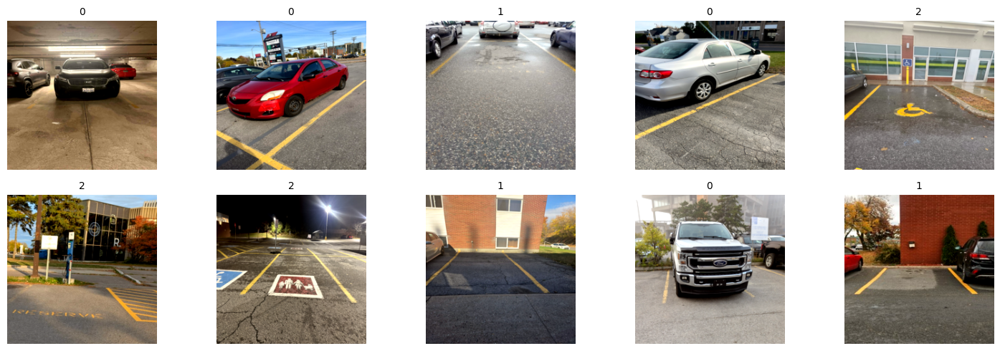

In [ ]:
from torchvision import datasets, transforms
from torchvision import datasets, transforms
import torchvision

def basic_transformation(mean_norm=[0.4708, 0.4624, 0.4475], std_norm=[0.1734, 0.1694, 0.1711]):


  transform = transforms.Compose([
      transforms.Resize((224, 224)),      # Standard CNN input
      transforms.ToTensor(),              # Convertir en tenseur [0,1]
      transforms.Normalize(               # Normalisation
          mean=mean_norm,
          std=std_norm
      )
  ])

  train_dataset,val_dataset,test_dataset, train_loader, val_loader, test_loader=chargementImages(train_transform=transform,
                                                                                                val_transform=transform,
                                                                                                test_transform=transform,
                                                                                                data_dir = "/content/drive/MyDrive/projet /images_V2")

  inputs, labels = next(iter(train_loader))
  class_names = train_dataset.dataset.classes
  imshow_grid(inputs[:10], labels[:10], class_names, nrow=5, figsize=(15,5))

  return train_dataset,val_dataset,test_dataset, train_loader, val_loader, test_loader

train_dataset,val_dataset,test_dataset, train_loader, val_loader, test_loader=basic_transformation(mean_norm=[0.4708, 0.4624, 0.4475],
                                                                                                   std_norm=[0.1734, 0.1694, 0.1711])



En visualisant les images, nous remarquons que les images sont bien chargées et bien classées. Nous pouvons passer à la modelisation


**Justification de la méthode de chargerment**


Nous avons opté pour ce mode de chargement car il nous permet de travailler proprement et efficacement, sans avoir à réorganiser manuellement les images en plusieurs dossiers. En utilisant ImageFolder puis un découpage interne du dataset, nous conservons l’intégralité des fichiers au même endroit tout en bénéficiant d’une répartition aléatoire et contrôlée (avec le seed) entre l’entraînement, la validation et le test. Cette méthode limite les risques d’erreurs, offre une grande souplesse pour ajuster les proportions des splits, et nous permet d’appliquer facilement des transformations différentes selon chaque sous-ensemble(train, val, test). Selon moi c’est une approche pratique, cohérente et parfaitement adaptée au cadre expérimental de notre projet.

# Partie 2 - Modèle CNN classique

## I - Implémentation   d'un CNN classique et  toutes les fonctions utiles


##### ***- Class Flexible du CNN***

Etant donnée que nous envisageons créer plusieurs modèles en se basant sur les architectures étudiées au cours, nous allons écrire notre classe modèle de manière la plus flexible possible en intégrant les similarités ainsi que les particularités

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class FlexibleCNN(nn.Module):
    def __init__(self,
                 input_channels=3,
                 num_classes=3,
                 conv_layers=[(16, 3, 1, 1), (32, 3, 1, 1)],  # (out_channels, kernel, stride, padding)
                 fc_layers=[128],
                 use_dropout=False,
                 dropout_prob=0.5,
                 use_batchnorm=False,
                 vgg=False,# Pour activer une architecture de vgg
                 resnet=False, # Pour activer une architecture de resnet
                 num_blocks=2):
        super(FlexibleCNN, self).__init__()

        self.features = nn.Sequential()
        in_channels = input_channels

        if vgg:
            #  VGG-style : grouper les couches par bloc
            assert len(conv_layers) % num_blocks == 0, "Le nombre de couches doit être divisible par le nombre de blocs" # pour afficher un AssertionError
            layers_per_block = len(conv_layers) // num_blocks

            for b in range(num_blocks):
                for i in range(layers_per_block):
                    idx = b * layers_per_block + i # formule pour calculer l'index exacte pour chaque élément.
                    out_channels, kernel, stride, padding = conv_layers[idx]
                    self.features.add_module(f"conv_b{b}_{i}", nn.Conv2d(in_channels, out_channels, kernel, stride, padding))
                    if use_batchnorm:
                        self.features.add_module(f"bn_b{b}_{i}", nn.BatchNorm2d(out_channels))
                    self.features.add_module(f"relu_b{b}_{i}", nn.ReLU())
                    if use_dropout:
                        self.features.add_module(f"dropout_b{b}_{i}", nn.Dropout2d(dropout_prob))
                    in_channels = out_channels
                # MaxPool à la fin de chaque bloc
                self.features.add_module(f"pool_b{b}", nn.MaxPool2d(2))


        elif resnet:
          # Style ResNet-like: un seul MaxPool, réduction via stride=2
          for i, (out_channels, kernel, stride, padding) in enumerate(conv_layers):
              self.features.add_module(f"conv{i}", nn.Conv2d(in_channels, out_channels, kernel, stride, padding))
              if use_batchnorm:
                  self.features.add_module(f"bn{i}", nn.BatchNorm2d(out_channels))
              self.features.add_module(f"relu{i}", nn.ReLU())

              # Ajouter MaxPool uniquement après la première convolution (comme ResNet)
              if i == 0:
                  self.features.add_module(f"pool{i}", nn.MaxPool2d(kernel_size=3, stride=2, padding=1))

              in_channels = out_channels

        else:
            #  Architecture standard : conv -> relu -> pool
            for i, (out_channels, kernel, stride, padding) in enumerate(conv_layers):
                self.features.add_module(f"conv{i}", nn.Conv2d(in_channels, out_channels, kernel, stride, padding))
                if use_batchnorm:
                    self.features.add_module(f"bn{i}", nn.BatchNorm2d(out_channels))
                self.features.add_module(f"relu{i}", nn.ReLU())

                self.features.add_module(f"pool{i}", nn.MaxPool2d(2))

                if use_dropout:
                    self.features.add_module(f"dropout{i}", nn.Dropout2d(dropout_prob))
                in_channels = out_channels



        #  Empêche les erreurs de taille à sortie avant la couche dernière

        self.global_pool = nn.AdaptiveAvgPool2d((1, 1))


        # Calcul de la taille après convolution pour les Fully Connected
        with torch.no_grad():
            dummy_input = torch.zeros(1, input_channels, 224, 224)
            dummy_output = self.features(dummy_input)
            dummy_output = self.global_pool(dummy_output)  #  Passage obligatoire
            flatten_size = dummy_output.view(1, -1).size(1)

        #  Construction dynamique des Fully Connected
        self.classifier = nn.Sequential()
        in_features = flatten_size
        for j, fc_size in enumerate(fc_layers):
            self.classifier.add_module(f"fc{j}", nn.Linear(in_features, fc_size))
            self.classifier.add_module(f"relu_fc{j}", nn.ReLU())
            if use_batchnorm:
                self.classifier.add_module(f"bn_fc{j}", nn.BatchNorm1d(fc_size))
            if use_dropout:
                self.classifier.add_module(f"dropout_fc{j}", nn.Dropout(dropout_prob))
            in_features = fc_size



        #  Dernière couche de sortie
        self.classifier.add_module("output", nn.Linear(in_features, num_classes))

    def forward(self, x):
        x = self.features(x)
        x = self.global_pool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x


##### ***- Fonctions d'entrainnement du modèle***

In [ ]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import copy
import time


def train_model(model, train_loader, val_loader, criterion, optimizer, device,
                num_epochs=10, scheduler=None, display_plot=True,
                early_stopping=False, patience=3,
                save_best_model=True, checkpoint_path="best_model.pth"):

    model.to(device)
    start_time = time.time()


    history = {
        "train_loss": [],
        "val_loss": [],
        "train_acc": [],
        "val_acc": []
    }

    best_val_loss = float('inf')
    best_model_wts = copy.deepcopy(model.state_dict())
    epochs_no_improve = 0

    for epoch in range(1, num_epochs + 1):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()# predicted == labels donne un tenseur booleen . sum() vient compter juste les true

        epoch_train_loss = running_loss / len(train_loader.dataset)
        epoch_train_acc = correct_train / total_train

        # Validation
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                _, predicted = torch.max(outputs.data, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

        epoch_val_loss = val_loss / len(val_loader.dataset)
        epoch_val_acc = correct_val / total_val

        if scheduler:
            scheduler.step(epoch_val_loss)

        history["train_loss"].append(epoch_train_loss)
        history["val_loss"].append(epoch_val_loss)
        history["train_acc"].append(epoch_train_acc)
        history["val_acc"].append(epoch_val_acc)

        print(f"\nEpoch [{epoch}/{num_epochs}]")
        print(f" Train Loss: {epoch_train_loss:.4f} | Val   Loss: {epoch_val_loss:.4f}   --   Train Acc: {epoch_train_acc:.4f} | Val   Acc: {epoch_val_acc:.4f}")


        # Early Stopping + Best model

        if early_stopping:
          if epoch_val_loss < best_val_loss:  # Amélioration détectée
              best_val_loss = epoch_val_loss
              best_model_wts = copy.deepcopy(model.state_dict())
              epochs_no_improve = 0  # reset patience
              if save_best_model:
                  torch.save(model.state_dict(), checkpoint_path)
                  print(f" Nouveau meilleur modèle sauvegardé ({checkpoint_path})")
          else:
              epochs_no_improve += 1
              print(f" Pas d'amélioration. Patience: {epochs_no_improve}/{patience}")
              if early_stopping and epochs_no_improve >= patience:
                  print(f" Early stopping déclenché à l'époque {epoch}")
                  break

    # Charger le meilleur modèle sauvegardé (d)
    if save_best_model:
        model.load_state_dict(best_model_wts)
        print(f"\n Meilleur modèle rechargé depuis {checkpoint_path}")

    if display_plot:
        plot_training_curves(history)

    end_time = time.time()
    training_time = end_time - start_time
    print(f"\n Temps total d'entraînement: {training_time:.2f} secondes ({training_time/60:.2f} minutes)")

    return model, history,training_time

#la fonction pour afficher la courbe d'entrainement et évaluation
def plot_training_curves(history):
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(history["train_loss"], label="Training Loss")
    plt.plot(history["val_loss"], label="Validation Loss")
    plt.title("Courbe de perte (Loss)")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history["train_acc"], label="Training Accuracy")
    plt.plot(history["val_acc"], label="Validation Accuracy")
    plt.title("Courbe d'accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()

    plt.show()


Durant l'entrainement, on va fournir un scheduler PyTorch pour la retropropagation. Celà va permettre au learning rate de diminuer automatiquement et intelligemment durant l'entraînement en cas de stagnation afin d'améliorer les performances.

##### ***- Fonctions d'évaluation du modèle***

In [ ]:
import torch
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import seaborn as sns
class_names = ["Occupée", "Libre", "Libre mais interdite"]

def evaluate_model(model, dataloader, device, class_names=class_names, show_class_report=False,
                   csv_file_path="/content/drive/MyDrive/projet /stattistic_resultats.csv", model_name=None, training_time=0,
                   error_exam=False):

    model.eval()
    model.to(device)

    all_labels = []
    all_predictions = []
    all_images = []

    with torch.no_grad():
        for X, y in dataloader:
            X, y = X.to(device), y.to(device)
            outputs = model(X)
            _, preds = torch.max(outputs, 1)

            all_labels.extend(y.cpu().numpy())
            all_predictions.extend(preds.cpu().numpy())
            all_images.extend(X.cpu())

    all_labels = np.array(all_labels)
    all_predictions = np.array(all_predictions)
    all_images = np.array(all_images)

    # Accuracy globale
    accuracy = np.mean(all_labels == all_predictions)
    print(f"\n Accuracy globale du modèle : {accuracy*100:.2f}%")


    # les prédictions faussées
    if error_exam:
        errors_df = get_incorrect_predictions(all_images,all_labels,all_predictions, class_names=class_names)

        if len(errors_df) > 10:
            sample_df = errors_df.sample(n=10, replace=False, random_state=42)
        else:
            sample_df = errors_df  # on prend tout

        imgs = list(sample_df["image"])
        titles = [f"Vrai: {t} | Prédit: {p}" for t, p in zip(sample_df["true_label_name"], sample_df["predicted_label_name"])]

        imshow_grid(torch.stack(imgs), titles=titles, nrow=5, figsize=(15,5))


    print(f"\n Accuracy globale du modèle : {accuracy*100:.2f}%")

    # Accuracy par classe
    if class_names is None:
        class_names = [str(i) for i in range(len(np.unique(all_labels)))]

    print("\n Accuracy par classe :")
    for i, class_name in enumerate(class_names):
        class_mask = all_labels == i
        class_acc = np.mean(all_predictions[class_mask] == all_labels[class_mask])
        print(f"  Classe {class_name}: {class_acc*100:.2f}%")

    # Matrice de confusion
    cm = confusion_matrix(all_labels, all_predictions)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d",
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel("Prédictions")
    plt.ylabel("Vérités terrain (Labels)")
    plt.title("Matrice de confusion")
    plt.show()

    # Rapport de classification
    if show_class_report:
        print("\n Rapport de classification :\n")
        print(classification_report(all_labels, all_predictions, target_names=class_names))


    #  Enregistrement dans le fichier CSV
    if model_name is not None and csv_file_path is not None:
        # Création du dossier parent s'il n'existe pas
        dir_path = os.path.dirname(csv_file_path)
        if not os.path.exists(dir_path):
            print(f" Création du dossier : {dir_path}")
            os.makedirs(dir_path, exist_ok=True)

        # Lecture sécurisée ou création du DataFrame
        if os.path.exists(csv_file_path):
            try:
                df = pd.read_csv(csv_file_path, encoding='utf-8', on_bad_lines='skip')
            except Exception:
                df = pd.read_csv(csv_file_path, encoding='latin1', on_bad_lines='skip')
        else:
            df = pd.DataFrame(columns=["model_name", "accuracy", "training_time"])

        # Nettoyage colonnes
        df.columns = df.columns.str.strip()

        # Nouvelle ligne
        new_row = {
            "model_name": model_name,
            "accuracy": round(float(accuracy), 4),
            "training_time": round(float(training_time), 2)
        }

        # Ajout de la ligne
        df = pd.concat([df, pd.DataFrame([new_row])], ignore_index=True)

        # Sauvegarde
        df.to_csv(csv_file_path, index=False, encoding='utf-8')
        print(f"\n Résultat sauvegardé dans : {csv_file_path}")

        # Affichage de la ligne ajoutée
        print("\n Nouvelle entrée ajoutée :")
        print(df.tail(1).to_string(index=False))

    if error_exam:
      return accuracy, errors_df

    return accuracy




##### ***-  Fonction pour trouver les mauvaises prédictions***


Cette fonction est utilisée ou intégrée dans la fonction d'évaluation directement

In [ ]:
def get_incorrect_predictions(all_images,all_labels, all_predictions, class_names=None):
    """
    Retourne un DataFrame avec les images mal prédites, leurs labels et prédictions.
    """
    incorrect_mask = all_labels != all_predictions
    incorrect_indices = np.where(incorrect_mask)[0]

    errors_df = pd.DataFrame({
        "index": incorrect_indices,
        "true_label": all_labels[incorrect_indices],
        "predicted_label": all_predictions[incorrect_indices]
    })

    if class_names is not None:
        errors_df["true_label_name"] = errors_df["true_label"].apply(lambda x: class_names[x])
        errors_df["predicted_label_name"] = errors_df["predicted_label"].apply(lambda x: class_names[x])

    # Récupérer les images correspondantes
    errors_df["image"] = [all_images[i] for i in incorrect_indices]

    return errors_df


## II Conception des différents CNN classique

En guise d'étude , nous allons concevoir plusieurs CNN , avec des architectures différentes. Les architectures des modèles seront inspirées de celle de certains modèles disponibles dans torch.vision et étudiées au cours.  Ainsi leur nom devrait refléter cet aspect.

Modele CNN classique 1 (ccn_classic_like_AlexNet)

FlexibleCNN(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (bn0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU()
    (pool0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (dropout0): Dropout2d(p=0.4, inplace=False)
    (conv1): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (bn1): BatchNorm2d(192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU()
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (dropout1): Dropout2d(p=0.4, inplace=False)
    (conv2): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn2): BatchNorm2d(384, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU()
    (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (dropout2): Dropout2d

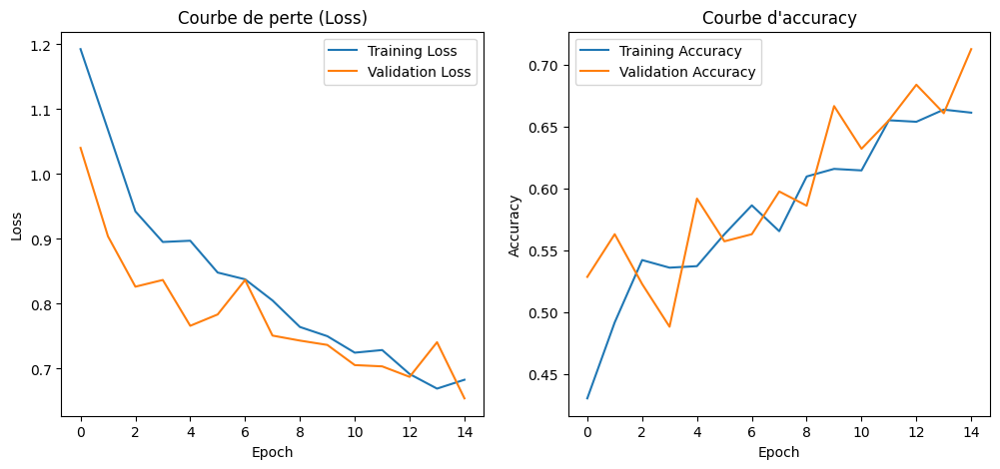


 Temps total d'entraînement: 3356.41 secondes (55.94 minutes)

 Accuracy globale du modèle : 67.05%

 Accuracy par classe :
  Classe Occupée: 79.31%
  Classe Libre: 72.55%
  Classe Libre mais interdite: 52.24%


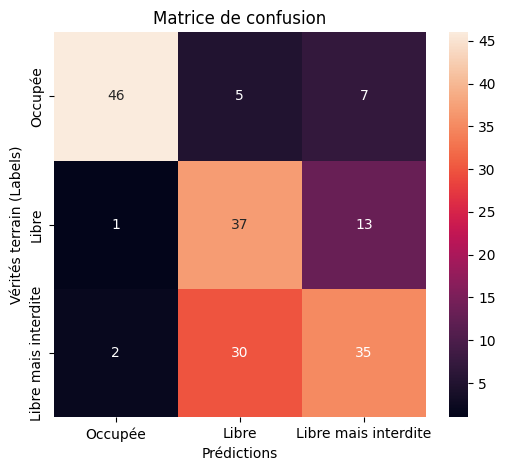


 Rapport de classification :

                      precision    recall  f1-score   support

             Occupée       0.94      0.79      0.86        58
               Libre       0.51      0.73      0.60        51
Libre mais interdite       0.64      0.52      0.57        67

            accuracy                           0.67       176
           macro avg       0.70      0.68      0.68       176
        weighted avg       0.70      0.67      0.68       176


 Accuracy sauvegardée dans : /content/drive/MyDrive/projet /stattistic_resultats.csv


np.float64(0.6704545454545454)

In [ ]:
ccn_classic_like_AlexNet = FlexibleCNN(
    input_channels=3,
    num_classes=3,
    conv_layers=[
        (64, 11, 4, 2),   # Conv1
        (192, 5, 1, 2),   # Conv2
        (384, 3, 1, 1),   # Conv3
        (256, 3, 1, 1),   # Conv4
        (256, 3, 1, 1)    # Conv5
    ],
    fc_layers=[512, 256],  # Fully connected comme AlexNet
    use_dropout=True,
    dropout_prob=0.4,
    use_batchnorm=True,
    vgg=False              # On garde le mode CNN standard
)

torch.save(ccn_classic_like_AlexNet.state_dict(), 'ccn_classic_like_AlexNet.pt')

print(ccn_classic_like_AlexNet)




device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(ccn_classic_like_AlexNet.parameters(), lr=1e-3, weight_decay=1e-4)


# Réduit le learning rate si la validation loss stagne
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2
)

model, history ,training_time = train_model(

    ccn_classic_like_AlexNet,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    device,
    num_epochs=15,
    scheduler=scheduler,
    early_stopping=True,
    patience=5
)


evaluate_model(
    model,
    test_loader,
    device,
    class_names=class_names,
    show_class_report=True,
    training_time=training_time,
    model_name='ccn_classic_like_AlexNet'
)




En guise de test nous allons faire l'entrainement sur 15 epoch sans early stopping pour voir combien de fois le modèle a déclanché la patience


Epoch [1/15]
 Train Loss: 0.6787 | Val   Loss: 0.7222   --   Train Acc: 0.6540 | Val   Acc: 0.6552

Epoch [2/15]
 Train Loss: 0.6688 | Val   Loss: 0.6773   --   Train Acc: 0.6479 | Val   Acc: 0.6897

Epoch [3/15]
 Train Loss: 0.6458 | Val   Loss: 0.6798   --   Train Acc: 0.7018 | Val   Acc: 0.6897

Epoch [4/15]
 Train Loss: 0.6433 | Val   Loss: 0.6594   --   Train Acc: 0.6810 | Val   Acc: 0.6897

Epoch [5/15]
 Train Loss: 0.6637 | Val   Loss: 0.6621   --   Train Acc: 0.6626 | Val   Acc: 0.6782

Epoch [6/15]
 Train Loss: 0.6243 | Val   Loss: 0.6373   --   Train Acc: 0.6969 | Val   Acc: 0.7069

Epoch [7/15]
 Train Loss: 0.6299 | Val   Loss: 0.6904   --   Train Acc: 0.6761 | Val   Acc: 0.6667

Epoch [8/15]
 Train Loss: 0.5964 | Val   Loss: 0.6412   --   Train Acc: 0.7178 | Val   Acc: 0.7184

Epoch [9/15]
 Train Loss: 0.5913 | Val   Loss: 0.6926   --   Train Acc: 0.7092 | Val   Acc: 0.6897

Epoch [10/15]
 Train Loss: 0.6119 | Val   Loss: 0.6308   --   Train Acc: 0.6945 | Val   Acc: 0.7356

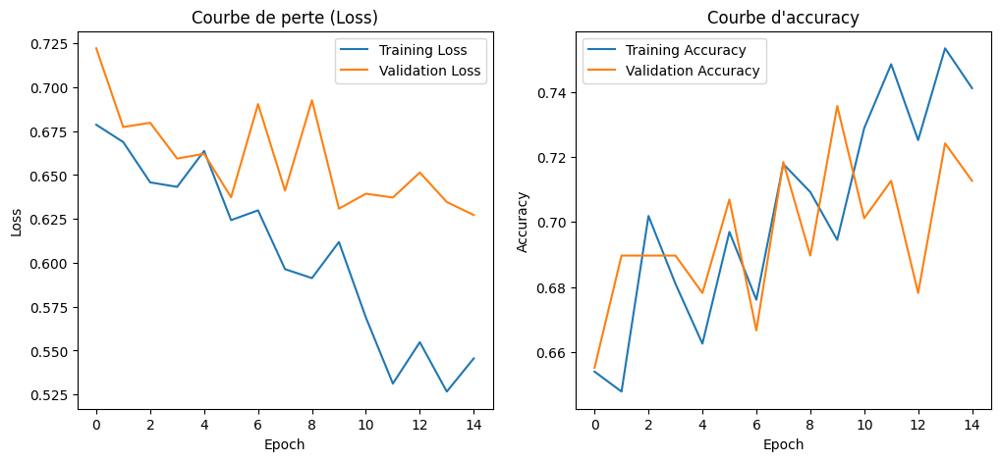


 Temps total d'entraînement: 3132.08 secondes (52.20 minutes)

 Accuracy globale du modèle : 67.05%

 Accuracy par classe :
  Classe Occupée: 79.31%
  Classe Libre: 72.55%
  Classe Libre mais interdite: 52.24%


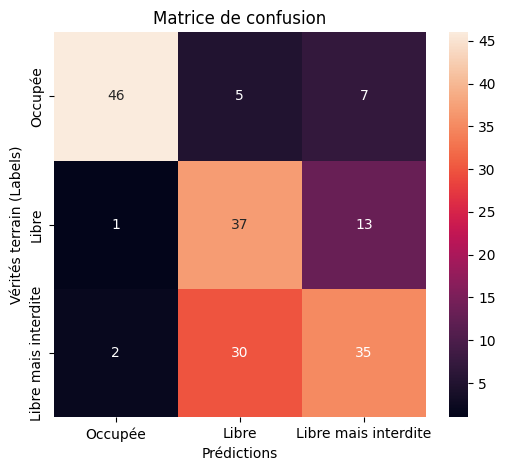


 Rapport de classification :

                      precision    recall  f1-score   support

             Occupée       0.94      0.79      0.86        58
               Libre       0.51      0.73      0.60        51
Libre mais interdite       0.64      0.52      0.57        67

            accuracy                           0.67       176
           macro avg       0.70      0.68      0.68       176
        weighted avg       0.70      0.67      0.68       176


 Accuracy sauvegardée dans : /content/drive/MyDrive/projet /stattistic_resultats.csv


np.float64(0.6704545454545454)

In [ ]:
model, history ,training_time  = train_model(

    ccn_classic_like_AlexNet,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    device,
    num_epochs=15,
    scheduler=scheduler,
    early_stopping=False
)


evaluate_model(
    model,
    test_loader,
    device,
    class_names=class_names,
    show_class_report=True,
    training_time=training_time,
    model_name='ccn_classic_like_AlexNet'
)


Il n'y a pas de grand changement avec ou sans early stopping. La patience a été déclanché juste une seule fois.

Nous remarquons que le train loss ne descend pas vraiment beaucoup. Etant donné que nous avons un shelduler qui ajuste automatiquement le learning rate, nous allons nous tourner vers l'architecture d'abord pour une lègère complexité du modèle.

Pour optimiser les performances du modèles, gagner en temps d'entrainement , et aussi éviter le surapprentissange, nous allons utiliser le early stopping pour le reste de l'étude.


Modele CNN classique 2 (ccn_classic_like_mini_ResNet)

FlexibleCNN(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3))
    (bn0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU()
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU()
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU()
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu3): ReLU()
    (conv4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn4): BatchNorm2d(128, eps

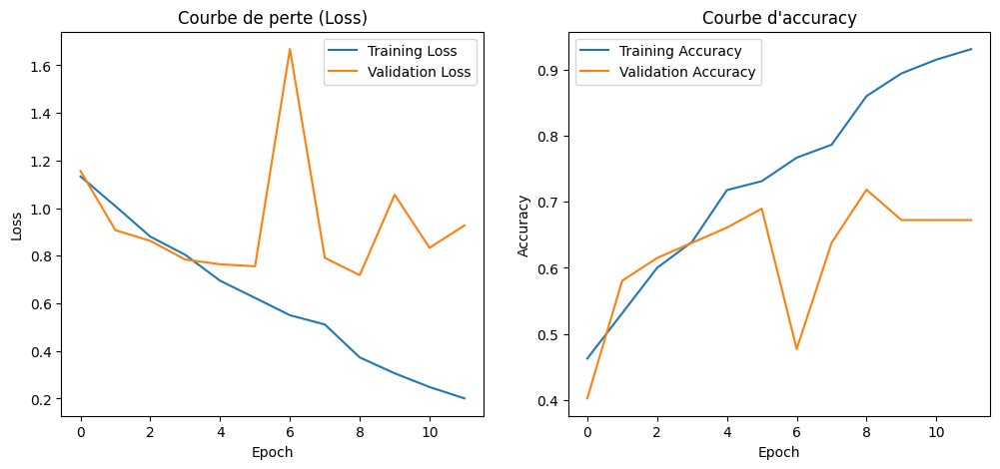


 Temps total d'entraînement: 2347.20 secondes (39.12 minutes)

 Accuracy globale du modèle : 72.16%

 Accuracy par classe :
  Classe Occupée: 73.33%
  Classe Libre: 67.27%
  Classe Libre mais interdite: 75.41%


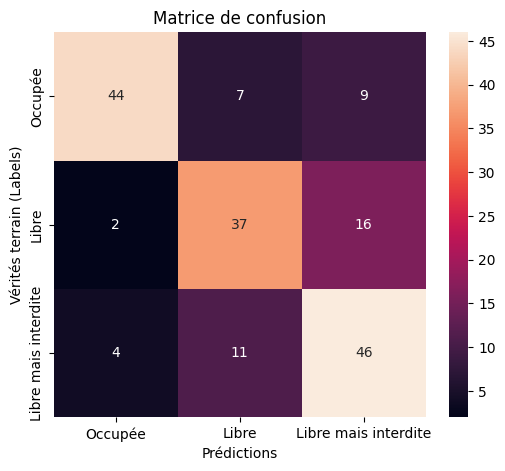


 Rapport de classification :

                      precision    recall  f1-score   support

             Occupée       0.88      0.73      0.80        60
               Libre       0.67      0.67      0.67        55
Libre mais interdite       0.65      0.75      0.70        61

            accuracy                           0.72       176
           macro avg       0.73      0.72      0.72       176
        weighted avg       0.73      0.72      0.72       176


 Accuracy sauvegardée dans : /content/drive/MyDrive/projet /stattistic_resultats.csv


np.float64(0.7215909090909091)

In [ ]:
ccn_classic_like_mini_ResNet = FlexibleCNN(
    input_channels=3,
    num_classes=3,
    conv_layers=[
        (64, 7, 2, 3),   # Conv1 large kernel
        (64, 3, 1, 1),   # Bloc 1.1
        (64, 3, 1, 1),   # Bloc 1.2

        (128, 3, 2, 1),  # Bloc 2.1
        (128, 3, 1, 1),  # Bloc 2.2

        (256, 3, 2, 1),  # Bloc 3.1
        (256, 3, 1, 1),  # Bloc 3.2

        (512, 3, 2, 1),  # Bloc 4.1
        (512, 3, 1, 1),  # Bloc 4.2
    ],
    fc_layers=[512,256],      # couche fully connected
    use_dropout=True,
    dropout_prob=0.5,
    use_batchnorm=True,   # BatchNorm comme ResNet
    vgg=False,             # architecture vgg désactivé
    resnet=True           # architecture resnet activé (la succession des couches)
)


print(ccn_classic_like_mini_ResNet)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(ccn_classic_like_mini_ResNet.parameters(), lr=1e-4, weight_decay=1e-4)



# Réduit le learning rate si la validation loss stagne
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2
)

model, history ,training_time  = train_model(
    ccn_classic_like_mini_ResNet,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    device,
    num_epochs=15,
    early_stopping=True,
    patience=3,
    scheduler=scheduler,
    checkpoint_path="ccn_classic_like_mini_ResNet"
)


evaluate_model(
    ccn_classic_like_mini_ResNet,
    test_loader,
    device,
    class_names=class_names,
    show_class_report=True,
    training_time=training_time,
    model_name='ccn_classic_like_mini_ResNet'

)



En rendant le modèle un peu complexe, nous avons une amélioration. Remarquons que le modèle a connu un moment de surapprentissage entre l'époch 7 et 9.

Celà peut être liée soit à un mauvais ajustement automatique de learning rate (Adam) ou soit à un moment de surapprentissage liée à la complexité du modèle ou à la taille de notre jeu de données.

Conclusion: Avec l'architecture ccn_classic_like_mini_ResNet, nous avons eu un modèle plus performant. mais on continue les recherches.

Modele CNN classique 3 (ccn_classic_like_vgg)

FlexibleCNN(
  (features): Sequential(
    (conv_b0_0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn_b0_0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu_b0_0): ReLU()
    (dropout_b0_0): Dropout2d(p=0.4, inplace=False)
    (conv_b0_1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn_b0_1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu_b0_1): ReLU()
    (dropout_b0_1): Dropout2d(p=0.4, inplace=False)
    (conv_b0_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn_b0_2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu_b0_2): ReLU()
    (dropout_b0_2): Dropout2d(p=0.4, inplace=False)
    (pool_b0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv_b1_0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn_b1_0): BatchNorm2d

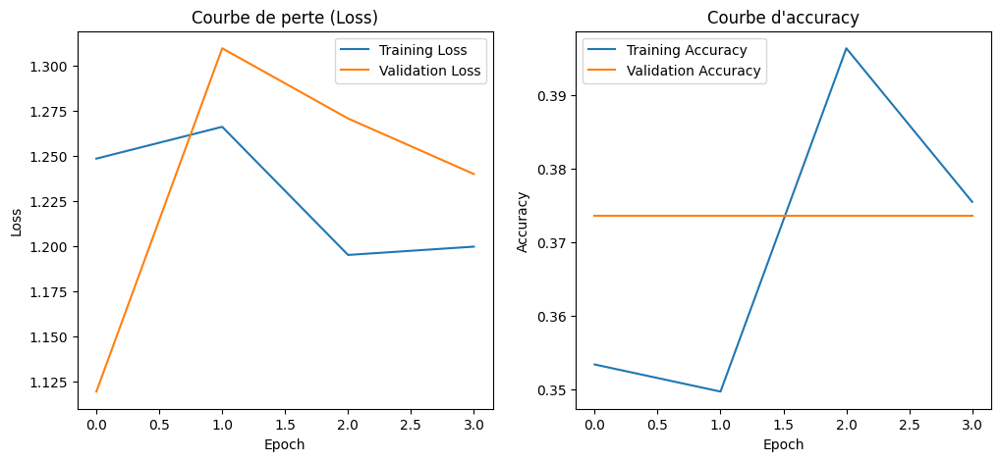


 Temps total d'entraînement: 8970.46 secondes (149.51 minutes)

 Accuracy globale du modèle : 32.39%

 Accuracy par classe :
  Classe Occupée: 0.00%
  Classe Libre: 100.00%
  Classe Libre mais interdite: 0.00%


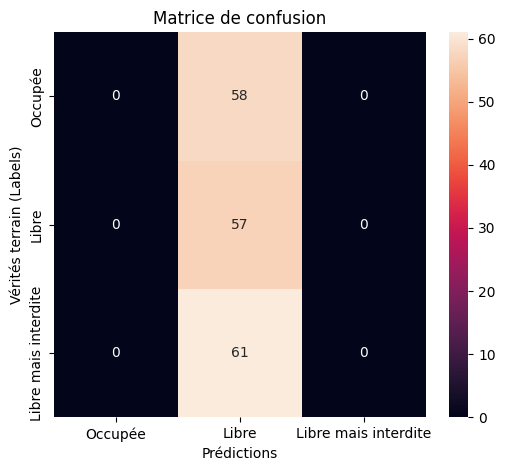


 Rapport de classification :

                      precision    recall  f1-score   support

             Occupée       0.00      0.00      0.00        58
               Libre       0.32      1.00      0.49        57
Libre mais interdite       0.00      0.00      0.00        61

            accuracy                           0.32       176
           macro avg       0.11      0.33      0.16       176
        weighted avg       0.10      0.32      0.16       176



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/tmp/ipython-input-3321141427.py:100: FutureWarni

OSError: Cannot save file into a non-existent directory: '/content/drive/MyDrive/projet'

In [ ]:
ccn_classic_like_vgg = FlexibleCNN(
    input_channels=3,
    num_classes=3,
    conv_layers=[
        # Bloc 1 (3 conv)
        (64, 3, 1, 1), (64, 3, 1, 1), (64, 3, 1, 1),

        # Bloc 2 (3 conv)
        (128, 3, 1, 1), (128, 3, 1, 1), (128, 3, 1, 1),

        # Bloc 3 (3 conv)
        (256, 3, 1, 1), (256, 3, 1, 1), (256, 3, 1, 1),

        # Bloc 4 (3 conv)
        (256, 3, 1, 1), (256, 3, 1, 1), (512, 3, 1, 1),
    ],
    fc_layers=[256, 128],
    use_dropout=True,
    dropout_prob=0.4,
    use_batchnorm=True,
    vgg=True,          #  active les blocs façon VGG
    num_blocks=4       # 4 blocs exactement
)

print(ccn_classic_like_vgg)



device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(ccn_classic_like_vgg.parameters(), lr=0.0001)

# Réduit le learning rate si la validation loss stagne
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2
)


model, history ,training_time  = train_model(
    ccn_classic_like_vgg,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    device,
    num_epochs=12,
    early_stopping=True,
    patience=3,
    scheduler=scheduler,
    checkpoint_path="ccn_classic_like_vgg.pt"
)


evaluate_model(
    ccn_classic_like_vgg,
    test_loader,
    device,
    class_names=class_names,
    show_class_report=True,
    training_time=training_time,
    model_name='ccn_classic_like_vgg'

)


En utilisant l'architecture VGG, on remarque que le modèle surapprend très rapidement, malgré les dimunitions du nombres de neurones par couches effectuée. Le surapprentissage survient très tôt; déjà à partir du deuxième epoch.

Conclusion: l'architecture du modèle demeure complexe

Ce surrapprentissage peut être liée soit à la taille du jeu de données, soit à la façon dont les blocs sont empilées selon l'architecture VGG.





Pour la suite nous allons essayer un modèle hybride , inspiré de deux types d'architectures.

Modele CNN classique 4 (ccn_classic_like_vgg2) mixte

Une architecture inspirée de la formation des blocs de vgg sans respecter intégralement la sucession des couches de convolution comme dans VGG

FlexibleCNN(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU()
    (pool0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU()
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU()
    (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn3): BatchNorm2d(128, eps=1e-05, momentum=

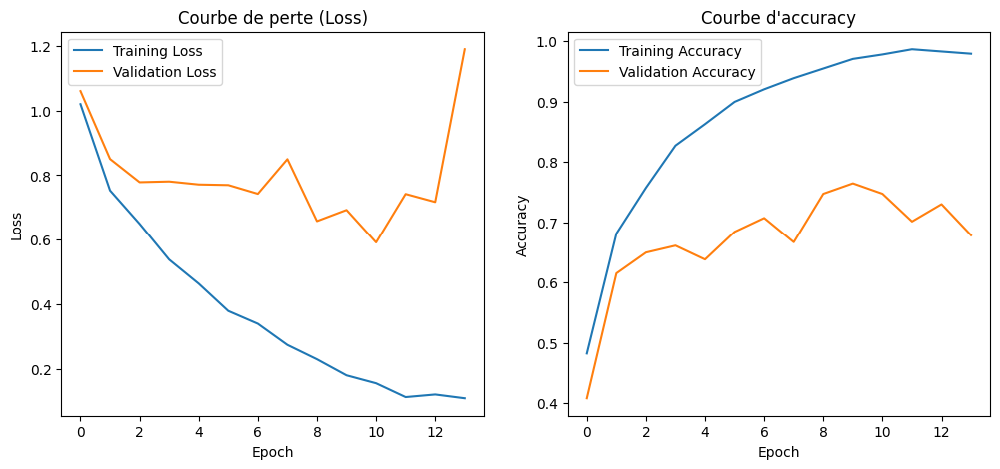


 Temps total d'entraînement: 3784.85 secondes (63.08 minutes)

 Accuracy globale du modèle : 76.70%

 Accuracy par classe :
  Classe Occupée: 88.33%
  Classe Libre: 65.45%
  Classe Libre mais interdite: 75.41%


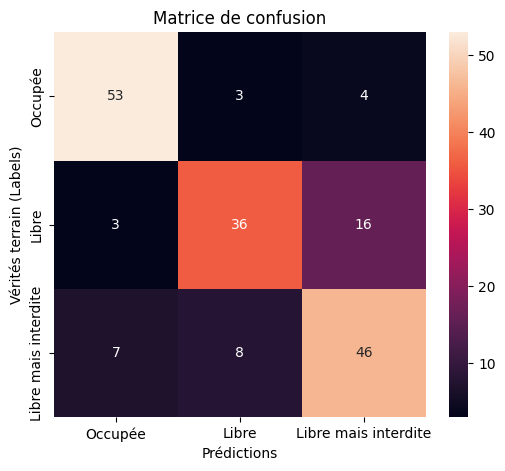


 Rapport de classification :

                      precision    recall  f1-score   support

             Occupée       0.84      0.88      0.86        60
               Libre       0.77      0.65      0.71        55
Libre mais interdite       0.70      0.75      0.72        61

            accuracy                           0.77       176
           macro avg       0.77      0.76      0.76       176
        weighted avg       0.77      0.77      0.77       176


 Résultat sauvegardé dans : /content/drive/MyDrive/projet /stattistic_resultats.csv

 Nouvelle entrée ajoutée :
           model_name  accuracy  training_time
ccn_classic_like_vgg2     0.767        3784.85


np.float64(0.7670454545454546)

In [ ]:
ccn_classic_like_vgg2 = FlexibleCNN(
    input_channels=3,
    num_classes=3,
    conv_layers=[
        # Bloc 1 (3 conv)
        (64, 3, 1, 1), (64, 3, 1, 1), (64, 3, 1, 1),

        # Bloc 2 (3 conv)
        (128, 3, 1, 1), (128, 3, 1, 1), (128, 3, 1, 1),

    ],
    fc_layers=[128, 96],
    use_dropout=False,
    dropout_prob=0.4,
    use_batchnorm=True,
    vgg=False,          #  les blocs se forme comme dans vgg mais ne respecte pas intégralement la succession des couches comme dans vgg
    num_blocks=2       # 2 blocs exactement

)


print(ccn_classic_like_vgg2)


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(ccn_classic_like_vgg2.parameters(), lr=1e-4, weight_decay=1e-4)

# Réduit le learning rate si la validation loss stagne
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2
)

model, history ,training_time  = train_model(
    ccn_classic_like_vgg2,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    device,
    num_epochs=15,
    scheduler=scheduler,
    early_stopping=True,
    patience=3,
    checkpoint_path="ccn_classic_like_vgg2.pt"


)


evaluate_model(
    ccn_classic_like_vgg2,
    test_loader,
    device,
    class_names=class_names,
    show_class_report=True,
    training_time=training_time,
    model_name='ccn_classic_like_vgg2'

)



Avec cette architecture hybride, nous avons obtenu une meilleure performance.  
Malgré un surapprentissage remarqué à partir de l'époque 12.

hypothèse: En combinant les deux architectures, nous avons tirer les avantages des deux comme réduire le complexité en effectuant une régulation (resnet) tout en apprenant mieux avec la profondeur(vgg).

.

Nous allons utiliserons ccn_classic_like_vgg2 dans  la partie suivante

**Conclusion partie 2**

Après cette  partie, la majorité de nos modèles sont perfomants  pour distinguer les places de parking occupées par rapport à celles libres,
mais ils ont du mal avec les places libre vs libre mais interdite, car ces classes se ressemblent visuellement.

Cela signifie qu'ils comprennent la présence d'un véhicule, mais ont encore du mal à reconnaître les indices d'interdiction (marques au sol, panneaux, autres objets, ...).

# Partie 3 - Augmentation des données

Afin de facilité la réutilisabilité, chaque alternative d'augementation sera présentée sous forme d'une fonction .

Notre augmentation concerne juste la partie train donc nous allons implémenter la transformation du test dans une petite fonction également.

In [ ]:
# Validation et Test restent SANS augmentation
def test_val_transform(mean_norm=[0.4708, 0.4624, 0.4475], std_norm=[0.1734, 0.1694, 0.1711]):# utiliser le mean et std trouvé.

  return transforms.Compose([
      transforms.Resize((224, 224)),
      transforms.ToTensor(),
      transforms.Normalize(mean=mean_norm,
        std=std_norm)
  ])

# Validation et Test restent SANS augmentation
test_val_transform = test_val_transform()

## I - Augmentation Alternative 1 : Transformations simples

##### ***- Les Transformations appliquées***

RandomResizedCrop     :    Rogne l'image aléatoirement

RandomHorizontalFlip  :   Retourner l’image horizontalement

RandomRotation (10°) :    Tilt léger  varie les angles de vue

ColorJitter (léger)  :    Ajuste couleurs/contraste/luminosité

Justifications

RandomResizedCrop  : capture les détails de l'image

RandomHorizontalFlip : simule différents angles de vue

RandomRotation(10) : augmente la robustesse face aux variations camera

ColorJitter : simule différentes conditions de luminosité (jour/soir/pluie)

Normalization : stabilise l’apprentissage

##### ***- Application des transformations sur notre jeu de données***

Total images: 1165 -> Train: 815, Val: 174, Test: 176

 Dataset chargé avec succès depuis : /content/drive/MyDrive/projet /images_V2
 Classes détectées : ['0', '1', '2']


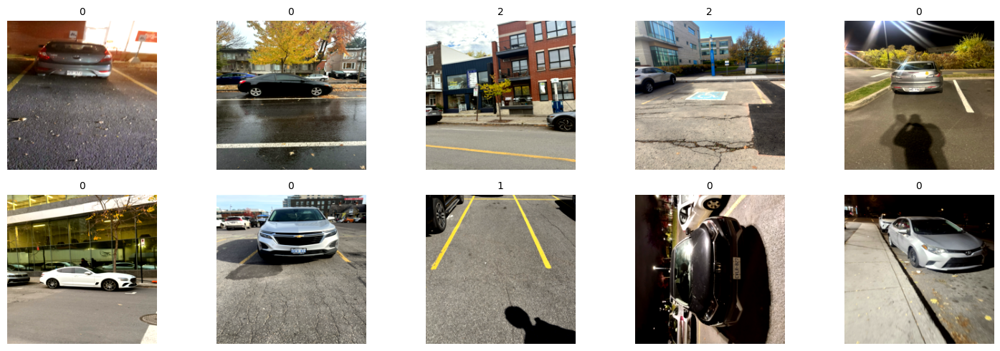

In [ ]:
from torchvision import datasets, transforms
from torchvision import datasets, transforms
import torchvision
from torchvision import transforms

def augmentation_alt1(mean_norm=[0.4708, 0.4624, 0.4475], std_norm=[0.1734, 0.1694, 0.1711]):

  # Augmentation Alternative 1
  train_transform_alt1 = transforms.Compose([
      transforms.RandomResizedCrop ((224, 224)),
      transforms.RandomHorizontalFlip(p=0.5),         # symétrie horizontale
      transforms.RandomRotation(10),                  # rotation légère ±10°
      transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
      transforms.ToTensor(),
      transforms.Normalize(               # Normalisation
          mean=mean_norm,
          std=std_norm
      )
  ])


  train_dataset_alt1,val_dataset,test_dataset, train_loader_alt1, val_loader, test_loader=chargementImages(train_transform=train_transform_alt1,
                                                                                                val_transform=test_val_transform,
                                                                                                test_transform=test_val_transform)
                                                                                                #test_val_transform : transformation sans augmentation


  # Afficher un batch d’images
  inputs, labels = next(iter(train_loader_alt1))
  class_names = train_dataset_alt1.dataset.classes
  imshow_grid(inputs[:10], labels[:10], class_names, nrow=5, figsize=(15,5))
  return train_dataset_alt1,val_dataset,test_dataset, train_loader_alt1, val_loader, test_loader

train_dataset_alt1,val_dataset,test_dataset, train_loader_alt1, val_loader, test_loader = augmentation_alt1(mean_norm=[0.4708, 0.4624, 0.4475],
                                                                                                               std_norm=[0.1734, 0.1694, 0.1711])

##### ***- Entrainnement et évaluation sur ces nouvelles données***

Modele CNN classique 1 (ccn_classic_like_vgg2_alt1)

FlexibleCNN(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU()
    (pool0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU()
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU()
    (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn3): BatchNorm2d(128, eps=1e-05, momentum=

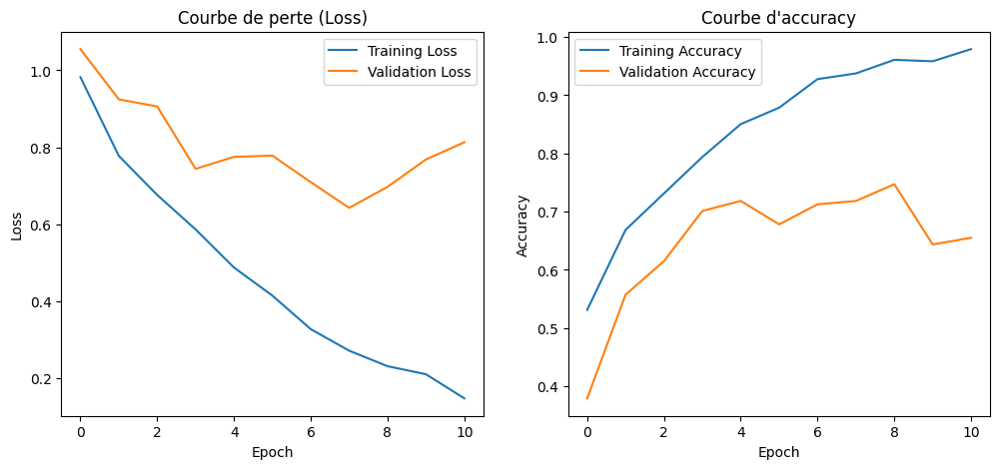


 Temps total d'entraînement: 1846.21 secondes (30.77 minutes)

 Accuracy globale du modèle : 66.48%

 Accuracy par classe :
  Classe 0: 83.64%
  Classe 1: 58.33%
  Classe 2: 59.02%


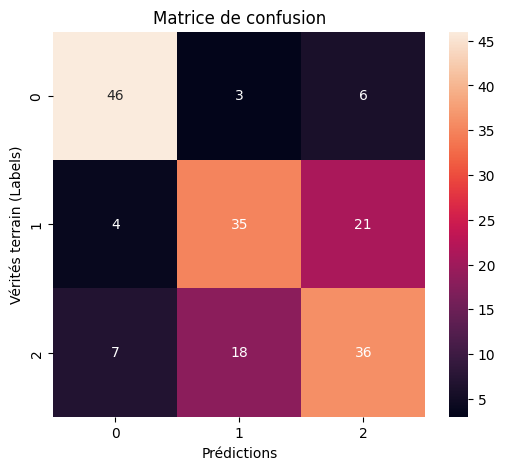


 Rapport de classification :

              precision    recall  f1-score   support

           0       0.81      0.84      0.82        55
           1       0.62      0.58      0.60        60
           2       0.57      0.59      0.58        61

    accuracy                           0.66       176
   macro avg       0.67      0.67      0.67       176
weighted avg       0.66      0.66      0.66       176


 Résultat sauvegardé dans : /content/drive/MyDrive/projet /stattistic_resultats.csv

 Nouvelle entrée ajoutée :
                model_name  accuracy  training_time
ccn_classic_like_vgg2_alt1    0.6648        1846.21


np.float64(0.6647727272727273)

In [ ]:
ccn_classic_like_vgg2_alt1 = FlexibleCNN(
    input_channels=3,
    num_classes=3,
    conv_layers=[
        # Bloc 1 (3 conv)
        (64, 3, 1, 1), (64, 3, 1, 1), (64, 3, 1, 1),

        # Bloc 2 (3 conv)
        (128, 3, 1, 1), (128, 3, 1, 1), (128, 3, 1, 1),

    ],
    fc_layers=[128, 96],
    use_dropout=False,
    dropout_prob=0.4,
    use_batchnorm=True,
    vgg=False,          #
    num_blocks=2       # 2 blocs exactement
)


print(ccn_classic_like_vgg2_alt1)


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(ccn_classic_like_vgg2_alt1.parameters(), lr=1e-4, weight_decay=1e-4)

# Réduit le learning rate si la validation loss stagne
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2
)

model, history ,training_time  = train_model(
    ccn_classic_like_vgg2_alt1,
    train_loader_alt1,
    val_loader,
    criterion,
    optimizer,
    device,
    num_epochs=15,
    scheduler=scheduler,
    early_stopping=True,
    patience=3,
    checkpoint_path="/content/drive/MyDrive/projet /ccn_classic_like_vgg2_alt1.pt"


)


evaluate_model(
    ccn_classic_like_vgg2_alt1,
    test_loader,
    device,
    class_names=class_names,
    show_class_report=True,
    training_time=training_time,
    model_name='ccn_classic_like_vgg2_alt1'

)







***Observation après application alt1***

Les augmentations appliquées ont trop modifié les détails visuels importants (marquages au sol, couleurs, orientation), ce qui a dégradé la capacité du modèle à distinguer Libre et Libre interdite, alors que la classe Occupée reste bien reconnue car elle repose sur des formes plus évidentes (présence de voiture). Cette alternative doit être combinée avec les images de bases pour  une meilleure performance.

## II - Augmentation Alternative 2 : Transformations un peu complexe

##### ***- Les Transformations appliquées***

RandomResizedCrop    :    Zoom aléatoire dans l’image

RandomHorizontalFlip :    Retourne horizontalement

RandomAffine         :    Rotation + translation

RandomPerspective    :    Perturbation 3D (perspective)

ColorJitter          :    Pour ajustement des couleurs



Justification


RandomResizedCrop : Simule zoom caméra ou recadrages

RandomAffine : Rend robuste aux légers décalages de la caméra

RandomPerspective : Simule angles de vue réels des parkings

ColorJitter : Variations météo/heure de la journée

BUT : Augmenter la généralisation du modèle CNN

##### ***- Application des transformations sur notre jeu de données***

Total images: 1165 -> Train: 815, Val: 174, Test: 176

 Dataset chargé avec succès depuis : /content/drive/MyDrive/projet /images_V2
 Classes détectées : ['0', '1', '2']


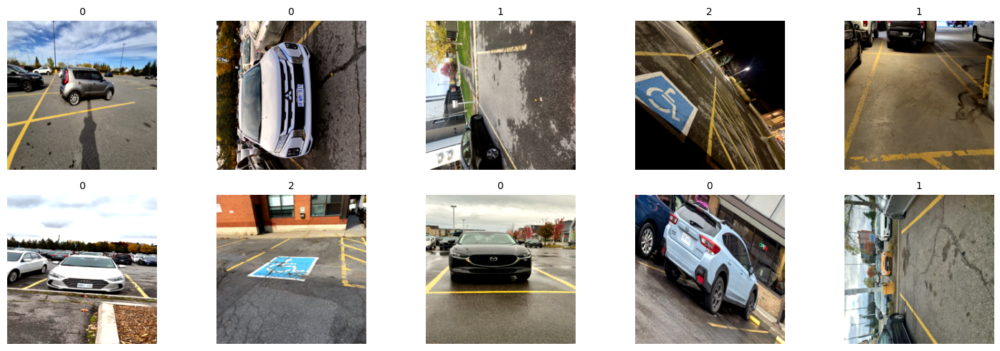

In [ ]:
from torchvision import datasets, transforms
from torchvision import datasets, transforms
import torchvision
from torchvision import transforms

def augmentation_alt2(mean_norm=[0.4708, 0.4624, 0.4475], std_norm=[0.1734, 0.1694, 0.1711]):

  # Augmentation Alternative 2 (un peu complexe)
  train_transform_alt2 = transforms.Compose([
      transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),   # zoom 80% à 100%
      transforms.RandomHorizontalFlip(p=0.5),                # flip horizontal
      transforms.RandomAffine(
          degrees=5,                                        # rotation max +/- 5° # faire attention car certaines image ont été rotées déjà durant la prise
          translate=(0.1, 0.1),                              # translation 10%
          shear=10                                           # inclinaison
      ),
      transforms.RandomPerspective(distortion_scale=0.2, p=0.5),  # perspective
      transforms.ColorJitter(brightness=0.2, contrast=0.2),
      transforms.ToTensor(),
      transforms.Normalize(               # Normalisation
          mean=mean_norm,
          std=std_norm
      )

  ])



  train_dataset_alt2,_,_, train_loader_alt2, _, _=chargementImages(train_transform=train_transform_alt2,
                                                                  val_transform=test_val_transform,
                                                                  test_transform=test_val_transform)


  # Afficher un batch d’images
  inputs, labels = next(iter(train_loader_alt2))
  class_names = train_dataset_alt2.dataset.classes
  imshow_grid(inputs[:10], labels[:10], class_names, nrow=5, figsize=(15,5))
  return train_dataset_alt2, train_loader_alt2

train_dataset_alt2, train_loader_alt2=augmentation_alt2(mean_norm=[0.4708, 0.4624, 0.4475], std_norm=[0.1734, 0.1694, 0.1711])

##### ***- Entrainnement et évaluation sur ces nouvelles données***

Modele CNN classique 1 (ccn_classic_like_mini_ResNet)

FlexibleCNN(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU()
    (pool0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU()
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU()
    (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn3): BatchNorm2d(128, eps=1e-05, momentum=

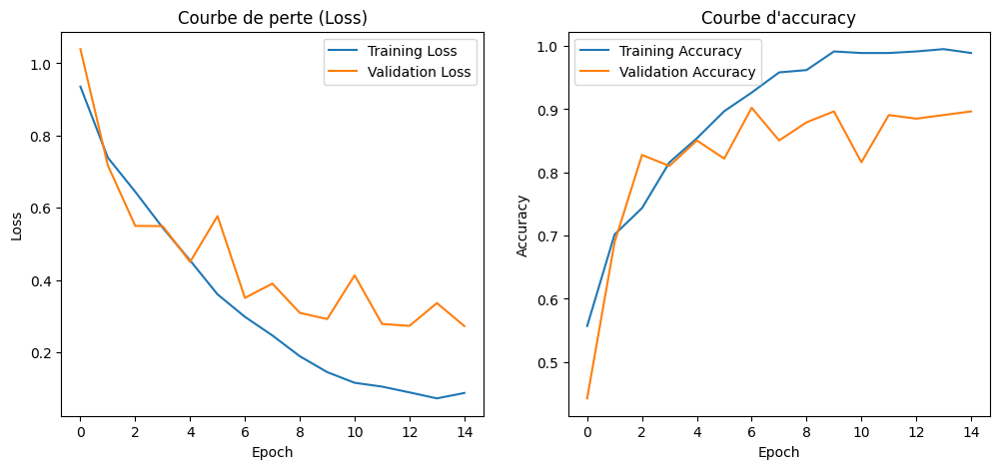


 Temps total d'entraînement: 6039.09 secondes (100.65 minutes)

 Accuracy globale du modèle : 85.80%

 Accuracy par classe :
  Classe 0: 88.64%
  Classe 1: 94.12%
  Classe 2: 75.00%


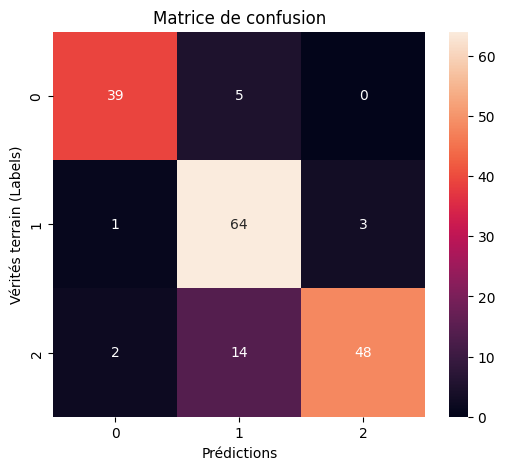


 Rapport de classification :

              precision    recall  f1-score   support

           0       0.93      0.89      0.91        44
           1       0.77      0.94      0.85        68
           2       0.94      0.75      0.83        64

    accuracy                           0.86       176
   macro avg       0.88      0.86      0.86       176
weighted avg       0.87      0.86      0.86       176


 Résultat sauvegardé dans : /content/drive/MyDrive/projet /stattistic_resultats.csv

 Nouvelle entrée ajoutée :
                model_name  accuracy  training_time
ccn_classic_like_vgg2_alt2     0.858        6039.09


np.float64(0.8579545454545454)

In [ ]:
ccn_classic_like_vgg2_alt2 = FlexibleCNN(
    input_channels=3,
    num_classes=3,
    conv_layers=[
        # Bloc 1 (3 conv)
        (64, 3, 1, 1), (64, 3, 1, 1), (64, 3, 1, 1),

        # Bloc 2 (3 conv)
        (128, 3, 1, 1), (128, 3, 1, 1), (128, 3, 1, 1),

    ],
    fc_layers=[128, 96],
    use_dropout=False,
    dropout_prob=0.4,
    use_batchnorm=True,
    vgg=False,          #
    num_blocks=2       # 2 blocs exactement
)


print(ccn_classic_like_vgg2_alt2)


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(ccn_classic_like_vgg2_alt2.parameters(), lr=1e-4, weight_decay=1e-4)

# Réduit le learning rate si la validation loss stagne
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2
)

model, history ,training_time  = train_model(
    ccn_classic_like_vgg2_alt2,
    train_loader_alt2,
    val_loader,
    criterion,
    optimizer,
    device,
    num_epochs=15,
    scheduler=scheduler,
    early_stopping=True,
    patience=3,
    checkpoint_path="/content/drive/MyDrive/projet /ccn_classic_like_vgg2_alt2.pt"


)


evaluate_model(
    ccn_classic_like_vgg2_alt2,
    test_loader,
    device,
    class_names=class_names,
    show_class_report=True,
    training_time=training_time,
    model_name='ccn_classic_like_vgg2_alt2'

)







***Observation après application alt2***

Les augmentations géométriques et de perspective ont rendu le modèle plus performant aux variations , ce qui a nettement amélioré la reconnaissance des classes Occupée et surtout Libre, mais la classe Libre interdite reste moins performante car ses indices visuels (marquages, panneaux) sont déformés ou moins visibles avec ces transformations.

## III - Augmentation Alternative 3 : Transformations complexe

##### ***- Les Transformations appliquées***

RandomApply GaussianBlur          :    Simule flou caméra donc mouvement

RandomApply RandomAdjustSharpness :    Simule images trop nettes ou dégradées

RandomApply Add Gaussian Noise    :    Bruit caméra

RandomShadow (custom)             :   Ombres réalistes

Ombres réalistes                  :    Retourne horizontalement

Flip + Rotation modérée           :    Rotation + retournement

Normalisation                     :    Standardisation


Justification


GaussianBlur : simule caméra qui bouge ou qualité basse

RandomShadow : reproduit ombres d’arbres / lampadaires / bâtiments

GaussianNoise : simule bruit capteur la nuit

Sharpness/Contrast : différentes qualités d’images smartphone

Rend le modèle robuste au monde réel

In [ ]:
!pip install pillow # blioblithèque pour manipuler les images

Total images: 1165 -> Train: 815, Val: 174, Test: 176

 Dataset chargé avec succès depuis : /content/drive/MyDrive/projet /images_V2
 Classes détectées : ['0', '1', '2']


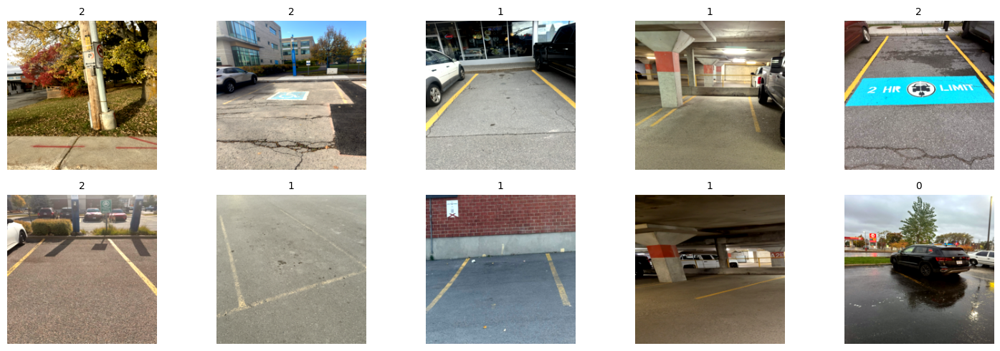

In [ ]:
from torchvision import transforms

# Augmentation Alternative 3(plus complexe)


import torch
import torchvision.transforms as transforms
import torchvision.transforms.functional as F
import random
from PIL import Image, ImageDraw

def augmentation_alt3(mean_norm=[0.4708, 0.4624, 0.4475], std_norm=[0.1734, 0.1694, 0.1711]):


  # Fonction personnalisée pour ajouter des ombres
  class RandomShadow:
      def __init__(self, shadow_prob=0.5):
          self.shadow_prob = shadow_prob

      def __call__(self, img):
          if random.random() < self.shadow_prob:
              w, h = img.size
              x1, y1 = random.randint(0, w-1), 0  # random.randint(0, w) peut retourner exactement w, alors que la largeur max pixel valide est w-1.
              x2, y2 = random.randint(0, w-1), h  #  ce qui peut biaisé la création du polygone(ombre)
              shadow = Image.new("RGB", (w, h), (0, 0, 0))
              mask = ImageDraw.Draw(shadow)
              mask.polygon([(x1, y1), (x2, y2), (w, h), (0, h)], fill=(0, 0, 0))
              img = Image.blend(img, shadow, alpha=0.5)
          return img


  # Ajout de bruit gaussien
  class GaussianNoise:
      def __init__(self, mean=0., std=0.05):
          self.mean = mean
          self.std = std

      def __call__(self, tensor):
          return tensor + torch.randn_like(tensor) * self.std + self.mean  #Crée un tenseur aléatoire du même shape que tensor, avec des valeurs
                                                                           # échantillonnées depuis la loi normale centrée réduite N(0,1).
                                                                           # Renvoie un nouveau tenseur identique à celui d'origine perturbé par le bruit.


  # Pipeline Alternative 3
  train_transform_alt3 = transforms.Compose([
      transforms.Resize((224, 224)),
      transforms.RandomHorizontalFlip(),
      transforms.RandomRotation(8),

      # Effets caméra réalistes
      transforms.RandomApply([transforms.GaussianBlur(3)], p=0.3),# Applique un flou gaussien aléatoire
      transforms.RandomApply([transforms.RandomAdjustSharpness(2)], p=0.3), # Renforce ou réduit la netteté de l’image
      transforms.RandomApply([transforms.ColorJitter(brightness=0.3, contrast=0.3)], p=0.5),# Modifie légèrement la luminosité et le contraste
      transforms.RandomApply([RandomShadow()], p=0.3),# Ajoute une ombre artificielle aléatoire
      transforms.RandomApply([GaussianNoise(0, 0.03)], p=0.4), # Ajoute une ombre artificielle aléatoire
      transforms.Normalize(               # Normalisation
          mean=mean_norm,
          std=std_norm
      )

  ])



  train_dataset_alt3,_,_, train_loader_alt3, _, _=chargementImages(train_transform=train_transform_alt3,
                                                                  val_transform=test_val_transform,
                                                                  test_transform=test_val_transform)


  # Afficher un batch d’images
  inputs, labels = next(iter(train_loader_alt3))
  class_names = train_dataset_alt3.dataset.classes
  imshow_grid(inputs[:10], labels[:10], class_names, nrow=5, figsize=(15,5))

  return train_dataset_alt3, train_loader_alt3

train_dataset_alt3, train_loader_alt3=augmentation_alt3(mean_norm=[0.4708, 0.4624, 0.4475], std_norm=[0.1734, 0.1694, 0.1711])

##### ***- Entrainnement et évaluation sur ces nouvelles données***

Modele CNN classique 1 (ccn_classic_like_mini_ResNet)

FlexibleCNN(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU()
    (pool0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU()
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU()
    (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn3): BatchNorm2d(128, eps=1e-05, momentum=

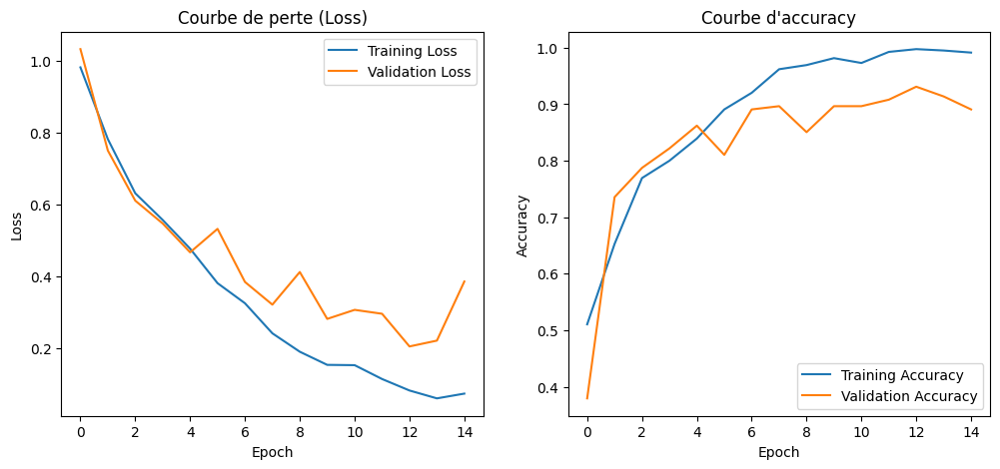


 Temps total d'entraînement: 6130.92 secondes (102.18 minutes)

 Accuracy globale du modèle : 91.48%

 Accuracy par classe :
  Classe 0: 97.73%
  Classe 1: 89.71%
  Classe 2: 89.06%


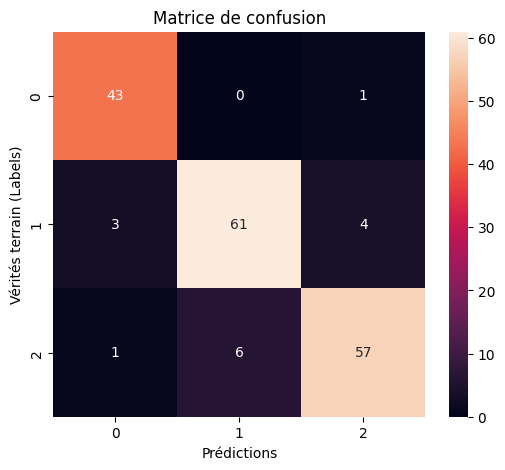


 Rapport de classification :

              precision    recall  f1-score   support

           0       0.91      0.98      0.95        44
           1       0.91      0.90      0.90        68
           2       0.92      0.89      0.90        64

    accuracy                           0.91       176
   macro avg       0.91      0.92      0.92       176
weighted avg       0.91      0.91      0.91       176


 Résultat sauvegardé dans : /content/drive/MyDrive/projet /stattistic_resultats.csv

 Nouvelle entrée ajoutée :
                model_name  accuracy  training_time
ccn_classic_like_vgg2_alt3    0.9148        6130.92


np.float64(0.9147727272727273)

In [ ]:
ccn_classic_like_vgg2_alt3 = FlexibleCNN(
    input_channels=3,
    num_classes=3,
    conv_layers=[
        # Bloc 1 (3 conv)
        (64, 3, 1, 1), (64, 3, 1, 1), (64, 3, 1, 1),

        # Bloc 2 (3 conv)
        (128, 3, 1, 1), (128, 3, 1, 1), (128, 3, 1, 1),

    ],
    fc_layers=[128, 96],
    use_dropout=False,
    dropout_prob=0.4,
    use_batchnorm=True,
    vgg=False,          #
    num_blocks=2       # 2 blocs exactement
)


print(ccn_classic_like_vgg2_alt3)


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(ccn_classic_like_vgg2_alt3.parameters(), lr=1e-4, weight_decay=1e-4)

# Réduit le learning rate si la validation loss stagne
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2
)

model, history ,training_time  = train_model(
    ccn_classic_like_vgg2_alt3,
    train_loader_alt3,
    val_loader,
    criterion,
    optimizer,
    device,
    num_epochs=15,
    scheduler=scheduler,
    early_stopping=True,
    patience=3,
    checkpoint_path="/content/drive/MyDrive/projet /ccn_classic_like_vgg2_alt3.pt"


)


evaluate_model(
    ccn_classic_like_vgg2_alt3,
    test_loader,
    device,
    class_names=class_names,
    show_class_report=True,
    training_time=training_time,
    model_name='ccn_classic_like_vgg2_alt3'

)







***Observation après application alt3***

Les transformations complexe (flou, bruit, ombres, ajustement de luminosité et rotation) ont rendu le modèle plus robuste face aux variations d’éclairage et de qualité d’image, améliorant sa capacité de généralisation.
La classe Occupée reste très bien reconnue malgré les perturbations, tandis que les classes Libre et surtout Libre mais interdite sont légèrement affectées, car les détails visuels (lignes, panneaux) sont parfois altérés et mal cadré.

## IV - Augmentation Alternative 4 : Transformations simples avec ajout de nouvelle donnée

##### ***- Les Transformations appliquées***

Concaténation de l'alternative 1 et le train loader original

Justification:

Pour faire augmentation mécanique du nombre d'image et aussi pour aider le modèle à identifier les  formes ou les couleurs spécifiques

##### ***- Application des transformations sur notre jeu de données***

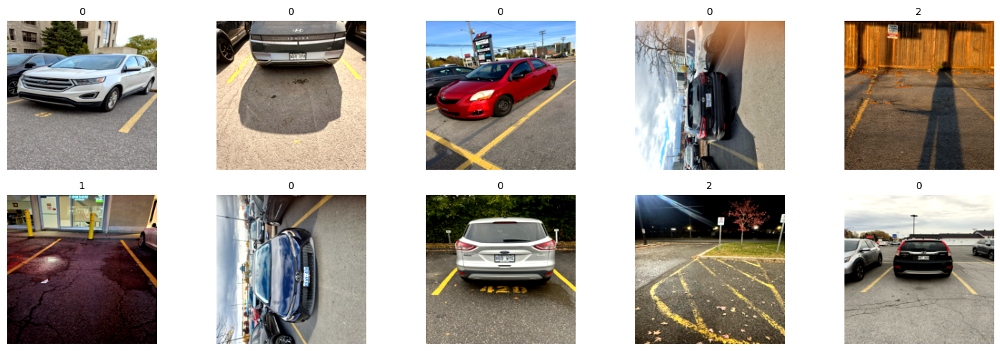

In [ ]:
from torchvision import datasets, transforms
from torchvision import datasets, transforms
import torchvision
from torch.utils.data import ConcatDataset, DataLoader



def augmentation_alt4():

  # Combine les deux datasets
  train_dataset_combined_alt4 = ConcatDataset([train_dataset, train_dataset_alt1])

  # Crée un DataLoader combiné
  train_loader_combined_alt4 = DataLoader(
      train_dataset_combined_alt4,
      batch_size=train_loader.batch_size,  # même taille de batch que ton loader d'origine
      shuffle=True,
      num_workers=2,  # ou plus selon ton environnement
  )


  # Afficher un batch d’images

  inputs, labels = next(iter(train_loader_combined_alt4))
  class_names = train_dataset_combined_alt4.datasets[0].dataset.classes
  imshow_grid(inputs[:10], labels[:10], class_names, nrow=5, figsize=(15,5))

  return train_dataset_combined_alt4, train_loader_combined_alt4

train_dataset_combined_alt4, train_loader_combined_alt4=augmentation_alt4()


##### ***- Entrainnement et évaluation sur ces nouvelles données***

Modele CNN classique 1 (ccn_classic_like_mini_ResNet)

FlexibleCNN(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU()
    (pool0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU()
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU()
    (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn3): BatchNorm2d(128, eps=1e-05, momentum=

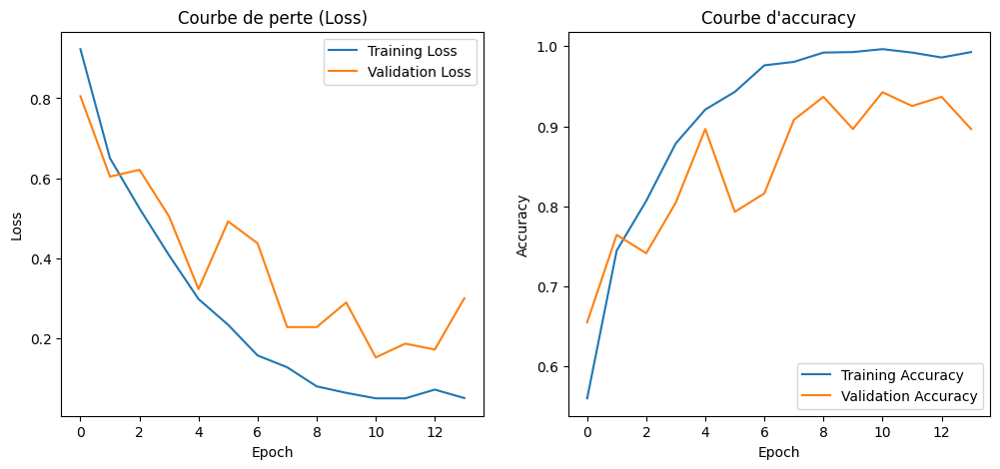


 Temps total d'entraînement: 9331.84 secondes (155.53 minutes)

 Accuracy globale du modèle : 92.61%

 Accuracy par classe :
  Classe 0: 95.83%
  Classe 1: 90.32%
  Classe 2: 92.42%


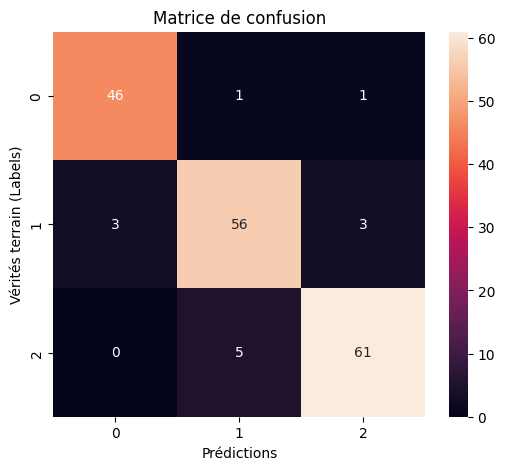


 Rapport de classification :

              precision    recall  f1-score   support

           0       0.94      0.96      0.95        48
           1       0.90      0.90      0.90        62
           2       0.94      0.92      0.93        66

    accuracy                           0.93       176
   macro avg       0.93      0.93      0.93       176
weighted avg       0.93      0.93      0.93       176


 Résultat sauvegardé dans : /content/drive/MyDrive/projet /stattistic_resultats.csv

 Nouvelle entrée ajoutée :
                model_name  accuracy  training_time
ccn_classic_like_vgg2_alt4    0.9261        9331.84


np.float64(0.9261363636363636)

In [ ]:
ccn_classic_like_vgg2_alt4 = FlexibleCNN(
    input_channels=3,
    num_classes=3,
    conv_layers=[
        # Bloc 1 (3 conv)
        (64, 3, 1, 1), (64, 3, 1, 1), (64, 3, 1, 1),

        # Bloc 2 (3 conv)
        (128, 3, 1, 1), (128, 3, 1, 1), (128, 3, 1, 1),

    ],
    fc_layers=[128, 96],
    use_dropout=False,
    dropout_prob=0.4,
    use_batchnorm=True,
    vgg=False,          #  active les blocs façon VGG
    num_blocks=2       # 2 blocs exactement
)


print(ccn_classic_like_vgg2_alt4)


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(ccn_classic_like_vgg2_alt4.parameters(), lr=1e-4, weight_decay=1e-4)

# Réduit le learning rate si la validation loss stagne
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2
)

model, history ,training_time  = train_model(
    ccn_classic_like_vgg2_alt4,
    train_loader_combined_alt4,
    val_loader,
    criterion,
    optimizer,
    device,
    num_epochs=15,
    scheduler=scheduler,
    early_stopping=True,
    patience=3,
    checkpoint_path="/content/drive/MyDrive/projet /ccn_classic_like_vgg2_alt4.pt"


)


evaluate_model(
    ccn_classic_like_vgg2_alt4,
    test_loader,
    device,
    class_names=class_names,
    show_class_report=True,
    training_time=training_time,
    model_name='ccn_classic_like_vgg2_alt4'

)







***Observation après application alt4***

Enrichissant considérablement la diversité des exemples vus par le modèle.
Le réseau apprend ainsi à mieux généraliser, ce qui augmente la robustesse et l’équilibre entre les classes.

Les résultats montrent une hausse globale de l’accuracy (92.6%), avec des performances homogènes sur les trois classes.
Les classes Libre et Libre mais interdite bénéficient particulièrement de cette diversité, tandis que la classe Occupée reste stable.

## V - Augmentation Alternative 5 : Transformations simples avec ajout de nouvelle donnée (combinaison associative des alternatives 1, 2, 3, 4, alt 5 , alt 6, alt 7 combiné avec notre tenseur de base)

##### ***- Les Transformations appliquées***

Combinaison de plusieurs alternatives dans la but de simuler le plus possible la réalité

**Justifications**

Aider le modèle à mieux apprendre et aussi reconnaitre la majorité des cas possibles

#####**Application des transformations**

Total images: 1165 -> Train: 815, Val: 174, Test: 176

 Dataset chargé avec succès depuis : /content/drive/MyDrive/projet /images_V2
 Classes détectées : ['0', '1', '2']
Total images: 1165 -> Train: 815, Val: 174, Test: 176

 Dataset chargé avec succès depuis : /content/drive/MyDrive/projet /images_V2
 Classes détectées : ['0', '1', '2']
Total images: 1165 -> Train: 815, Val: 174, Test: 176

 Dataset chargé avec succès depuis : /content/drive/MyDrive/projet /images_V2
 Classes détectées : ['0', '1', '2']


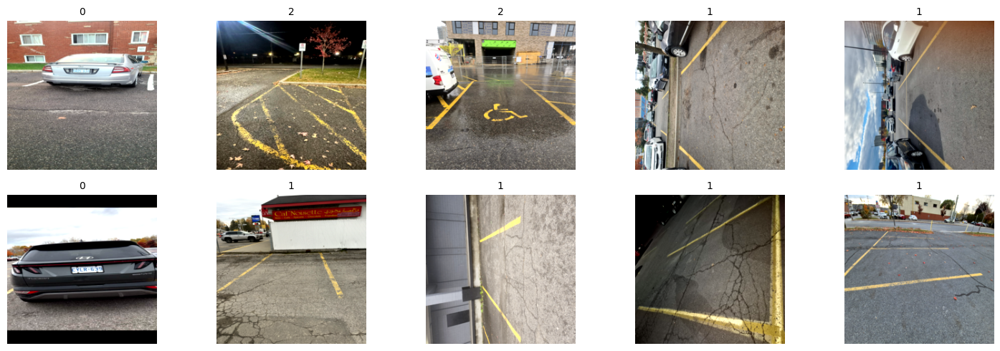

In [ ]:
from torchvision import datasets, transforms
from torchvision import datasets, transforms
import torchvision


from torchvision import transforms

def augmentation_alt5(mean_norm=[0.4708, 0.4624, 0.4475], std_norm=[0.1734, 0.1694, 0.1711]):

# Augmentation Alternative 5 combinaison


  train_transform_alt5 = transforms.Compose([
      transforms.RandomResizedCrop((224, 224)),
      transforms.RandomHorizontalFlip(p=0.5),
      transforms.RandomApply([transforms.Grayscale(num_output_channels=3)], p=0.2), # parfois image en niveaux de gris
      transforms.ColorJitter(brightness=0.4, contrast=0.3), # simulate éclairage variable
      transforms.GaussianBlur(kernel_size=5), # flou léger caméra
      transforms.ToTensor(),
      transforms.Normalize(               # Normalisation
          mean=mean_norm,
          std=std_norm
      )

  ])


  train_transform_alt6 = transforms.Compose([
      transforms.RandomResizedCrop((224, 224)),
      transforms.RandomHorizontalFlip(),
      transforms.RandomRotation(5),
      transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.4, hue=0.05),  # couleurs plus variées
      transforms.RandomApply([transforms.GaussianBlur(kernel_size=3)], p=0.4),         # flou aléatoire
      transforms.ToTensor(),
      transforms.Normalize(               # Normalisation
          mean=mean_norm,
          std=std_norm
      )

  ])


  train_transform_alt7 = transforms.Compose([
      transforms.RandomResizedCrop((224, 224)),
      transforms.RandomHorizontalFlip(),
      transforms.RandomApply([transforms.Grayscale(num_output_channels=3)], p=0.3),  # parfois perte de couleur
      transforms.ColorJitter(brightness=0.5, contrast=0.2, saturation=0.1),          # mauvais contraste
      transforms.RandomApply([transforms.GaussianBlur(kernel_size=7)], p=0.5),       # flou fort
      transforms.ToTensor(),
      transforms.Normalize(               # Normalisation
          mean=mean_norm,
          std=std_norm
      )

  ])




  train_dataset_alt5, _, _, train_loader_alt5, _, _ = chargementImages(train_transform=train_transform_alt5,
                                                                  val_transform=test_val_transform,
                                                                  test_transform=test_val_transform)


  train_dataset_alt6, _, _, train_loader_alt6, _, _ = chargementImages(train_transform=train_transform_alt6,
                                                                  val_transform=test_val_transform,
                                                                  test_transform=test_val_transform)

  train_dataset_alt7, _, _, train_loader_alt7, _, _ = chargementImages(train_transform=train_transform_alt7,
                                                                  val_transform=test_val_transform,
                                                                  test_transform=test_val_transform)




  from torch.utils.data import ConcatDataset, DataLoader

  # Combine les deux datasets
  train_dataset_combined_alt5 = ConcatDataset([train_dataset_alt1,train_dataset_alt2,train_dataset_alt3,train_dataset_combined_alt4,
                                              train_dataset_alt5,train_dataset_alt6,train_dataset_alt7,train_dataset])

  # Crée un DataLoader combiné
  train_loader_combined_alt5 = DataLoader(
      train_dataset_combined_alt5,
      batch_size=train_loader.batch_size,  # même taille de batch que ton loader d'origine
      shuffle=True,
      num_workers=2,  # ou plus selon ton environnement
  )



  # Afficher un batch d’images


  inputs, labels = next(iter(train_loader_combined_alt5))
  class_names = train_dataset_combined_alt5.datasets[0].dataset.classes
  imshow_grid(inputs[:10], labels[:10], class_names, nrow=5, figsize=(15,5))

  return train_dataset_combined_alt5, train_loader_combined_alt5
train_dataset_combined_alt5, train_loader_combined_alt5=augmentation_alt5(mean_norm=[0.4708, 0.4624, 0.4475], std_norm=[0.1734, 0.1694, 0.1711])


##### ***- Entrainnement et évaluation sur ces nouvelles données***

Modele CNN classique 1 (ccn_classic_like_mini_ResNet)

FlexibleCNN(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU()
    (pool0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU()
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU()
    (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn3): BatchNorm2d(128, eps=1e-05, momentum=

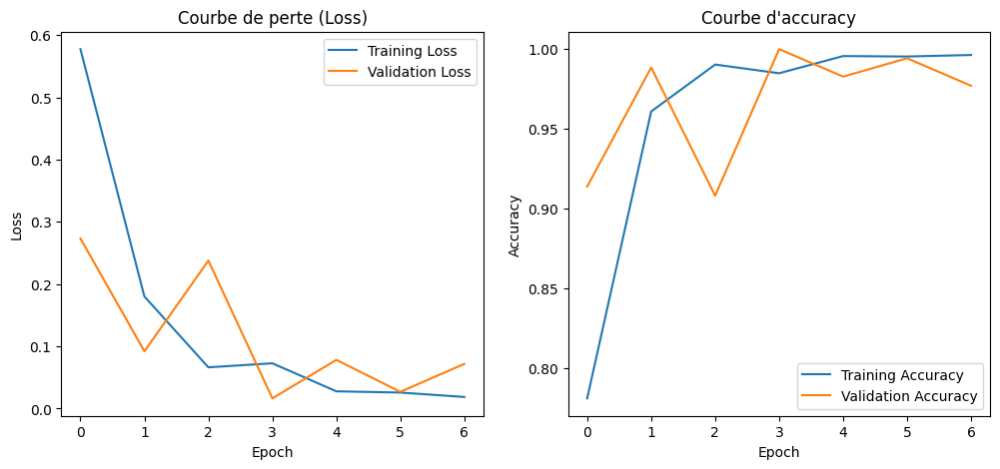


 Temps total d'entraînement: 17708.52 secondes (295.14 minutes)

 Accuracy globale du modèle : 98.30%

 Accuracy par classe :
  Classe 0: 100.00%
  Classe 1: 100.00%
  Classe 2: 95.45%


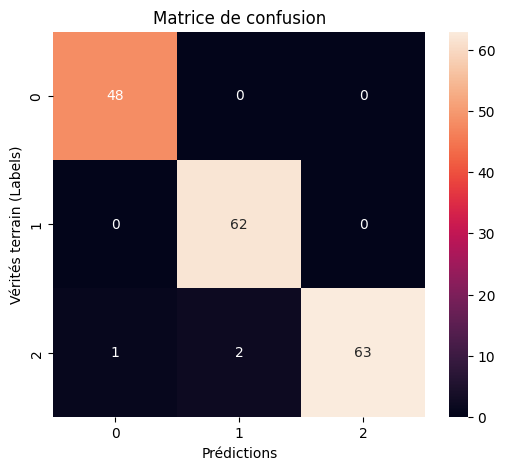


 Rapport de classification :

              precision    recall  f1-score   support

           0       0.98      1.00      0.99        48
           1       0.97      1.00      0.98        62
           2       1.00      0.95      0.98        66

    accuracy                           0.98       176
   macro avg       0.98      0.98      0.98       176
weighted avg       0.98      0.98      0.98       176


 Résultat sauvegardé dans : /content/drive/MyDrive/projet /stattistic_resultats.csv

 Nouvelle entrée ajoutée :
                model_name  accuracy  training_time
ccn_classic_like_vgg2_alt5     0.983       17708.52


np.float64(0.9829545454545454)

In [ ]:
ccn_classic_like_vgg2_alt5 = FlexibleCNN(
    input_channels=3,
    num_classes=3,
    conv_layers=[
        # Bloc 1 (3 conv)
        (64, 3, 1, 1), (64, 3, 1, 1), (64, 3, 1, 1),

        # Bloc 2 (3 conv)
        (128, 3, 1, 1), (128, 3, 1, 1), (128, 3, 1, 1),

    ],
    fc_layers=[128, 96],
    use_dropout=False,
    dropout_prob=0.4,
    use_batchnorm=True,
    vgg=False,          #  active les blocs façon VGG
    num_blocks=2       # 2 blocs exactement
)


print(ccn_classic_like_vgg2_alt5)


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(ccn_classic_like_vgg2_alt5.parameters(), lr=1e-4, weight_decay=1e-4)

# Réduit le learning rate si la validation loss stagne
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2
)

model, history ,training_time  = train_model(
    ccn_classic_like_vgg2_alt5,
    train_loader_combined_alt5,
    val_loader,
    criterion,
    optimizer,
    device,
    num_epochs=15,
    scheduler=scheduler,
    early_stopping=True,
    patience=3,
    checkpoint_path="/content/drive/MyDrive/projet /ccn_classic_like_vgg2_alt5.pt"


)


evaluate_model(
    ccn_classic_like_vgg2_alt5,
    test_loader,
    device,
    class_names=class_names,
    show_class_report=True,
    training_time=training_time,
    model_name='ccn_classic_like_vgg2_alt5'

)







***Observation après application alt5***

En réunissant toutes les stratégies d’augmentation précédentes (géométriques, photométriques, bruit, flou, ombre, niveaux de gris), créant ainsi un jeu d’entraînement extrêmement varié et proche des conditions réelles.
Le modèle est ainsi exposé à une très large gamme de variations visuelles, ce qui renforce sa robustesse et sa capacité de généralisation.

Les performances monte jusqu'à 98.3 % d’accuracy globale, avec 100 % sur les classes Occupée et Libre, et 95.45 % sur Libre mais interdite.
Cette dernière reste légèrement plus complexe à distinguer, probablement à cause de la diversité visuelle et de la présence des petits éléments (panneau trop petit ou très éloigné, marquage quasiment illisible).

# Partie 4 - Modèle CNN par Transfert

Dans cette partie, nous allons tester plusieurs modèles par transfert

##### ***- Transformation suivant imageNet***

Nous allons refaire les transformations surtout la partie de la normalisation suivant les données statistiques d'ImageNet.

Total images: 1165 -> Train: 815, Val: 174, Test: 176

 Dataset chargé avec succès depuis : /content/drive/MyDrive/projet /images_V2
 Classes détectées : ['0', '1', '2']


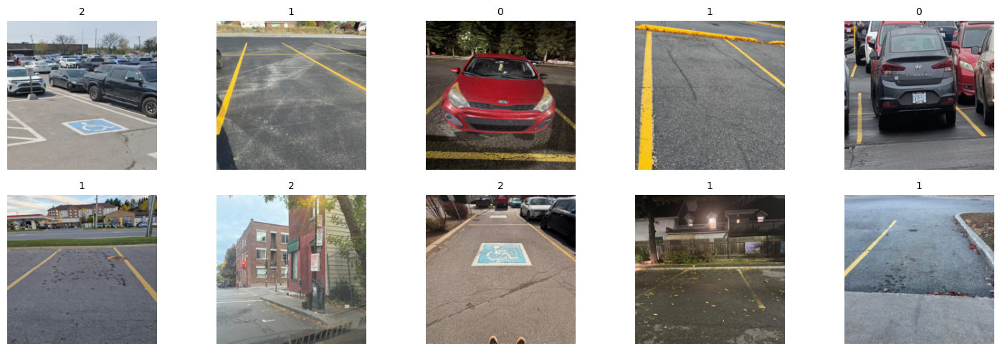

In [ ]:
train_dataset,val_dataset,test_dataset, train_loader, val_loader, test_loader=basic_transformation(mean_norm=[0.485, 0.456, 0.406],
                                                                                                   std_norm=[0.229, 0.224, 0.225])


##### ***- Justification du choix de modèle***

Pour cette partie, nous avons choisi de tester 3 modèles différents:

Nous avons choisi **ResNet152** pour le transfert d’apprentissage parce que c’est un modèle très profond, qui sera capable d’extraire des caractéristiques visuelles complexes et détaillées. Son architecture facilite l’entraînement et permet d’obtenir des représentations robustes.

Nous avons sélectionné **EfficientNet-B7** car il s’agit d’un des modèles les plus performants en termes de précision. Son architecture repose sur un  compromis optimal entre profondeur, largeur et résolution, ce qui lui permet d’atteindre une très haute performance sur ImageNet. C’est un choix privilégié lorsque l’objectif est de maximiser la précision, même si cela demande davantage de ressources.

Enfin, nous avons retenu **EfficientNet-B6** parce qu’il offre un compromis intéressant : il reste très performant, proche du niveau de B7, tout en étant moins exigeant en mémoire et en puissance de calcul. C’est une alternative  lorsque l’on souhaite de  bons résultats tout en réduisant les besoins en ressources.

## I - Modèle basé sur ResNet152

##### ***- Dernière couche degelée (fc)***

Downloading: "https://download.pytorch.org/models/resnet152-394f9c45.pth" to /root/.cache/torch/hub/checkpoints/resnet152-394f9c45.pth


100%|██████████| 230M/230M [00:01<00:00, 168MB/s]



Epoch [1/8]
 Train Loss: 1.0613 | Val   Loss: 0.9887   --   Train Acc: 0.4123 | Val   Acc: 0.5460
 Nouveau meilleur modèle sauvegardé (/content/drive/MyDrive/projet /model_resnet152.pt)

Epoch [2/8]
 Train Loss: 0.9482 | Val   Loss: 0.8875   --   Train Acc: 0.6380 | Val   Acc: 0.6839
 Nouveau meilleur modèle sauvegardé (/content/drive/MyDrive/projet /model_resnet152.pt)

Epoch [3/8]
 Train Loss: 0.8694 | Val   Loss: 0.8166   --   Train Acc: 0.6822 | Val   Acc: 0.7299
 Nouveau meilleur modèle sauvegardé (/content/drive/MyDrive/projet /model_resnet152.pt)

Epoch [4/8]
 Train Loss: 0.8065 | Val   Loss: 0.7567   --   Train Acc: 0.7337 | Val   Acc: 0.7644
 Nouveau meilleur modèle sauvegardé (/content/drive/MyDrive/projet /model_resnet152.pt)

Epoch [5/8]
 Train Loss: 0.7654 | Val   Loss: 0.7121   --   Train Acc: 0.7460 | Val   Acc: 0.7759
 Nouveau meilleur modèle sauvegardé (/content/drive/MyDrive/projet /model_resnet152.pt)

Epoch [6/8]
 Train Loss: 0.7218 | Val   Loss: 0.6749   --   Trai

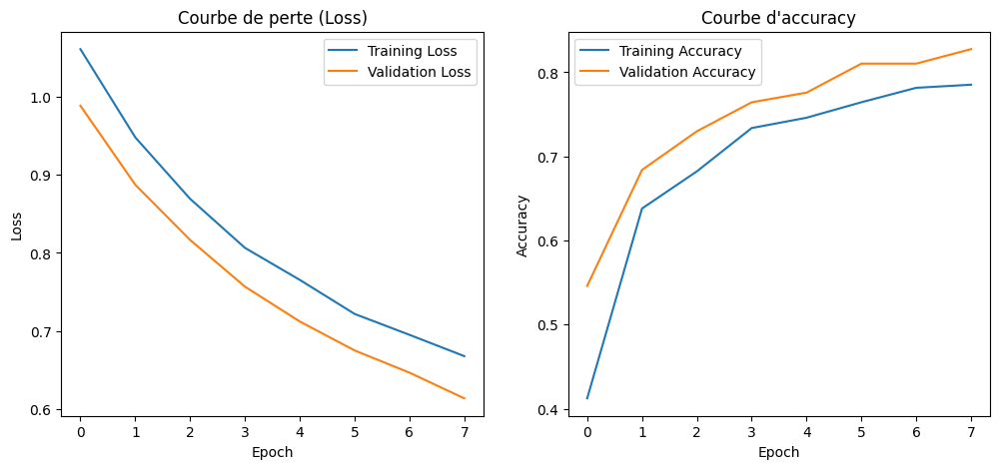


 Temps total d'entraînement: 6634.33 secondes (110.57 minutes)

 Accuracy globale du modèle : 75.57%

 Accuracy par classe :
  Classe 0: 97.92%
  Classe 1: 64.52%
  Classe 2: 69.70%


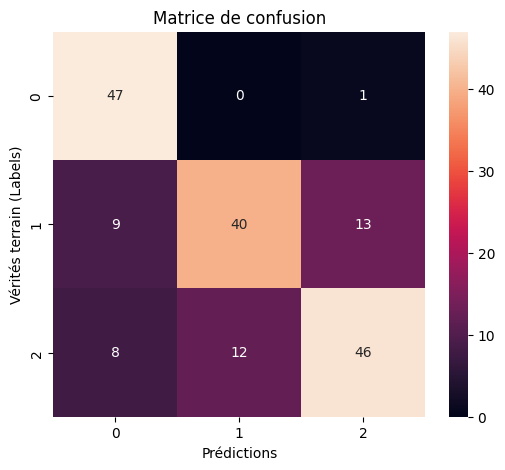


 Rapport de classification :

              precision    recall  f1-score   support

           0       0.73      0.98      0.84        48
           1       0.77      0.65      0.70        62
           2       0.77      0.70      0.73        66

    accuracy                           0.76       176
   macro avg       0.76      0.77      0.76       176
weighted avg       0.76      0.76      0.75       176


 Résultat sauvegardé dans : /content/drive/MyDrive/projet /stattistic_resultats.csv

 Nouvelle entrée ajoutée :
     model_name  accuracy  training_time
model_resnet152    0.7557        6634.33


np.float64(0.7556818181818182)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models

# -------------------------------
#  Charger ResNet152 pré-entraîné sur ImageNet
# -------------------------------
model_resnet152 = models.resnet152(weights=models.ResNet152_Weights.IMAGENET1K_V1)

# Geler toutes les couches
for param in model_resnet152.parameters():
    param.requires_grad = False

# Remplacer la dernière couche fc pour 3 classes
num_classes = 3
in_features = model_resnet152.fc.in_features
model_resnet152.fc = nn.Linear(in_features, num_classes)


# -------------------------------
#  Définir le device, loss et optimiseur
# -------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_resnet152 = model_resnet152.to(device)

criterion = nn.CrossEntropyLoss()

# Optimiseur pour la dernière couche uniquement
optimizer = optim.Adam(model_resnet152.fc.parameters(), lr=0.0001)

# -------------------------------
# Entraîner le modèle
# -------------------------------
# Réduit le learning rate si la validation loss stagne
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2
)

model, history ,training_time  = train_model(
    model_resnet152,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    device,
    num_epochs=8,
    scheduler=scheduler,
    early_stopping=True,
    patience=3,
    checkpoint_path="/content/drive/MyDrive/projet /model_resnet152.pt"


)

# -------------------------------
# Évaluer le modèle
# -------------------------------

evaluate_model(
    model_resnet152,
    test_loader,
    device,
    class_names=class_names,
    show_class_report=True,
    training_time=training_time,
    model_name='model_resnet152'

)


Le modèle ResNet152, bien qu’excellent sur la classe Occupée (97.9%), montre une baisse notable sur Libre (64.5%) et Libre mais interdite (69.7%).
Cette disparité peut être liée un manque de robustesse face à des variations liée à l'éclairage, angle de vue , ...

ResNet152 capture bien les motifs dominants (occupé: presence de véhicule) mais généralise mal sur les classes qui présentent plus ambiguïtés pour leur détection.

Hyptothèse:

1.En désactivant uniquement la dernière, le modèle présente des signes de sous apprentissage

2.Le modèle n'a pas assez de données pour un meilleur apprentissage, il faudra penser à une augmentation des données.

3.Les neurones de la dernière couche n'ont pas été suffissants pour mieux apprendre toutes les representations dans notre jeu de donnée.  

On validera ces hypothèses dans les études suivantes


##### ***- Dernière couche degelée (fc) et la couche 4 (dernier bloc de convolution)***


Epoch [1/8]
 Train Loss: 0.5648 | Val   Loss: 0.2011   --   Train Acc: 0.7656 | Val   Acc: 0.9425
 Nouveau meilleur modèle sauvegardé (/content/drive/MyDrive/projet /model_resnet152_l4.pt)

Epoch [2/8]
 Train Loss: 0.1529 | Val   Loss: 0.1278   --   Train Acc: 0.9485 | Val   Acc: 0.9540
 Nouveau meilleur modèle sauvegardé (/content/drive/MyDrive/projet /model_resnet152_l4.pt)

Epoch [3/8]
 Train Loss: 0.0552 | Val   Loss: 0.0844   --   Train Acc: 0.9853 | Val   Acc: 0.9598
 Nouveau meilleur modèle sauvegardé (/content/drive/MyDrive/projet /model_resnet152_l4.pt)

Epoch [4/8]
 Train Loss: 0.0251 | Val   Loss: 0.0920   --   Train Acc: 0.9963 | Val   Acc: 0.9598
 Pas d'amélioration. Patience: 1/3

Epoch [5/8]
 Train Loss: 0.0214 | Val   Loss: 0.0954   --   Train Acc: 0.9975 | Val   Acc: 0.9540
 Pas d'amélioration. Patience: 2/3

Epoch [6/8]
 Train Loss: 0.0114 | Val   Loss: 0.0870   --   Train Acc: 0.9975 | Val   Acc: 0.9655
 Pas d'amélioration. Patience: 3/3
 Early stopping déclenché à 

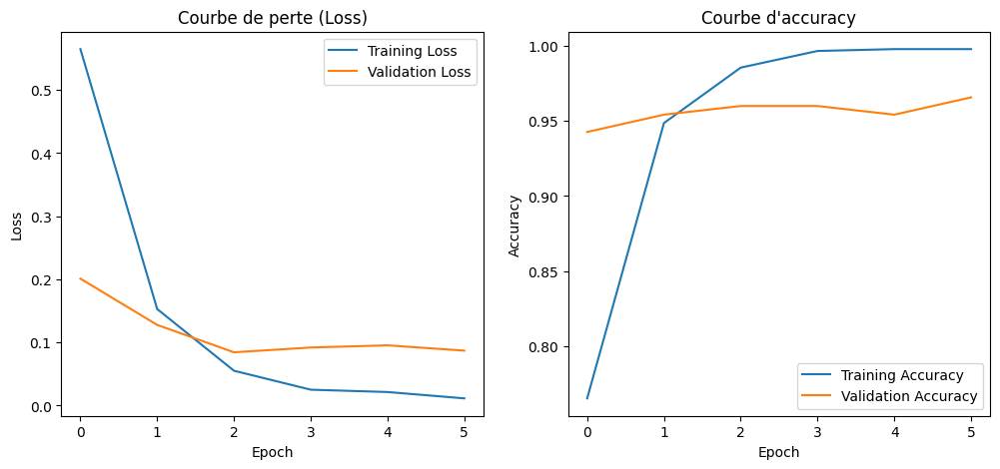


 Temps total d'entraînement: 5360.95 secondes (89.35 minutes)

 Accuracy globale du modèle : 93.75%

 Accuracy par classe :
  Classe 0: 97.92%
  Classe 1: 91.94%
  Classe 2: 92.42%


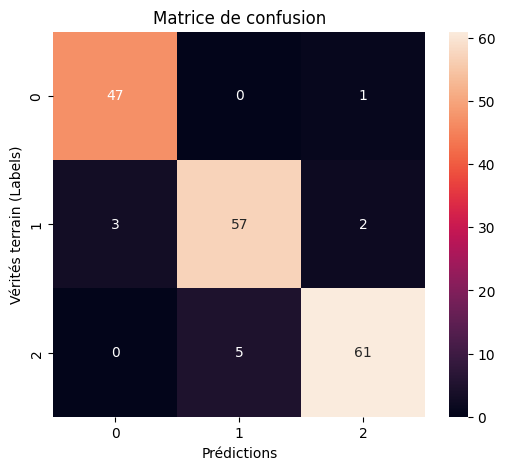


 Rapport de classification :

              precision    recall  f1-score   support

           0       0.94      0.98      0.96        48
           1       0.92      0.92      0.92        62
           2       0.95      0.92      0.94        66

    accuracy                           0.94       176
   macro avg       0.94      0.94      0.94       176
weighted avg       0.94      0.94      0.94       176


 Résultat sauvegardé dans : /content/drive/MyDrive/projet /stattistic_resultats.csv

 Nouvelle entrée ajoutée :
        model_name  accuracy  training_time
model_resnet152_l4    0.9375        5360.95


np.float64(0.9375)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models

# -------------------------------
# Charger ResNet152 pré-entraîné sur ImageNet
# -------------------------------
model_resnet152_l4 = models.resnet152(weights=models.ResNet152_Weights.IMAGENET1K_V1)

# Geler toutes les couches
for param in model_resnet152_l4.parameters():
    param.requires_grad = False

# Remplacer la dernière couche fc pour 3 classes
num_classes = 3
in_features = model_resnet152_l4.fc.in_features
model_resnet152_l4.fc = nn.Linear(in_features, num_classes)



# Dégeler tout le layer4
for param in model_resnet152_l4.layer4.parameters():
    param.requires_grad = True

# -------------------------------
#  Définir le device, loss et optimiseur
# -------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_resnet152_l4 = model_resnet152_l4.to(device)

criterion = nn.CrossEntropyLoss()

# Optimiseur pour toutes les couches dégelées (fc + layer4)
params_to_optimize = filter(lambda p: p.requires_grad, model_resnet152_l4.parameters())
optimizer = optim.Adam(params_to_optimize, lr=0.0001)

# -------------------------------
#  Afficher le modèle
# -------------------------------
print(model_resnet152_l4)

# -------------------------------
# Entraîner le modèle
# -------------------------------
# Réduit le learning rate si la validation loss stagne
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2
)

model, history ,training_time  = train_model(
    model_resnet152_l4,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    device,
    num_epochs=8,
    scheduler=scheduler,
    early_stopping=True,
    patience=3,
    checkpoint_path="/content/drive/MyDrive/projet /model_resnet152_l4.pt"


)

# -------------------------------
# Évaluer le modèle
# -------------------------------

evaluate_model(
    model_resnet152_l4,
    test_loader,
    device,
    class_names=class_names,
    show_class_report=True,
    training_time=training_time,
    model_name='model_resnet152_l4'

)


Le dégel du bloc Layer4 a permis au modèle d’affiner ses représentations visuelles sur les données spécifiques du jeu d’entraînement.
Résultat : une forte amélioration de la performance globale (93.75%), avec des scores désormais équilibrés entre les trois classes.

L’adaptation du Layer4 renforce la capacité du modèle à distinguer des détails visuels complexes (textures, ombres, marquages), ce qui améliore nettement la généralisation sans surapprentissage.(hypothèse 3 confirmée)

## II - Modèle basé sur EfficientNet-B7

##### ***- Dernière couche degelée (fc)***

Downloading: "https://download.pytorch.org/models/efficientnet_b7_lukemelas-c5b4e57e.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b7_lukemelas-c5b4e57e.pth


100%|██████████| 255M/255M [00:02<00:00, 126MB/s]


classifier.1.weight
classifier.1.bias
EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
            (1): BatchNorm2d(64, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(64, 16, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
  

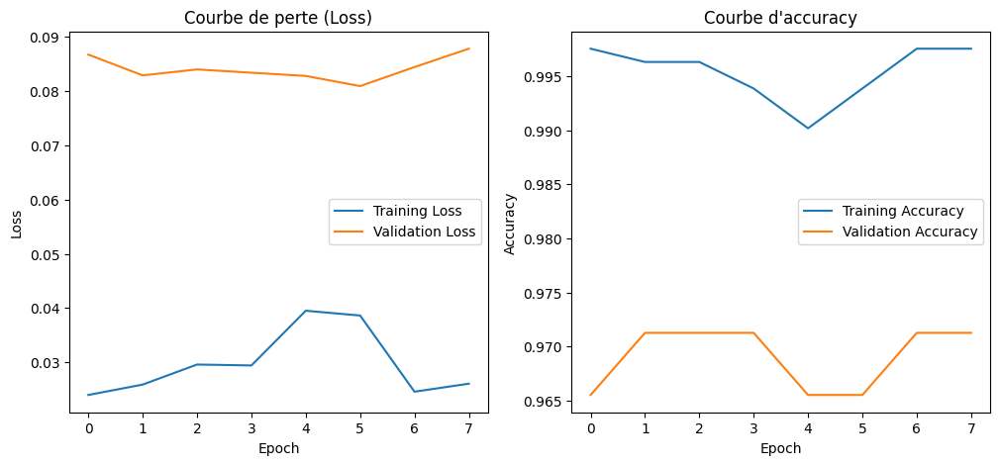


 Temps total d'entraînement: 7055.71 secondes (117.60 minutes)

 Accuracy globale du modèle : 94.89%

 Accuracy par classe :
  Classe 0: 97.92%
  Classe 1: 93.55%
  Classe 2: 93.94%


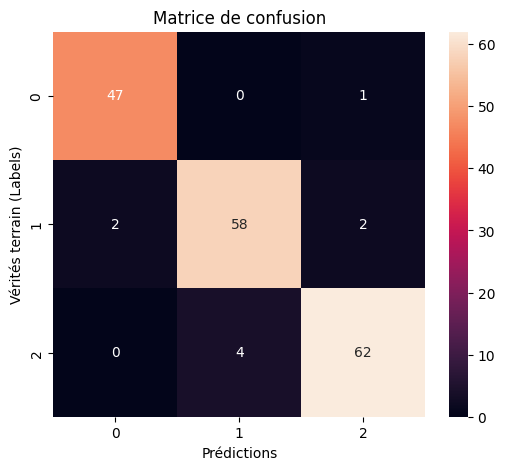


 Rapport de classification :

              precision    recall  f1-score   support

           0       0.96      0.98      0.97        48
           1       0.94      0.94      0.94        62
           2       0.95      0.94      0.95        66

    accuracy                           0.95       176
   macro avg       0.95      0.95      0.95       176
weighted avg       0.95      0.95      0.95       176


 Résultat sauvegardé dans : /content/drive/MyDrive/projet /stattistic_resultats.csv

 Nouvelle entrée ajoutée :
        model_name  accuracy  training_time
model_resnet152_l4    0.9489        7055.71


np.float64(0.9488636363636364)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models

# -------------------------------
# Charger EfficientNet-B7 pré-entraîné sur ImageNet
# -------------------------------
model_efficientnet_b7 = models.efficientnet_b7(weights=models.EfficientNet_B7_Weights.IMAGENET1K_V1)

# Geler toutes les couches
for param in model_efficientnet_b7.parameters():
    param.requires_grad = False

# Remplacer la dernière couche classifier pour 3 classes
num_classes = 3
in_features = model_efficientnet_b7.classifier[1].in_features
model_efficientnet_b7.classifier[1] = nn.Linear(in_features, num_classes)

# -------------------------------
#  Définir le device, loss et optimiseur
# -------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_efficientnet_b7 = model_efficientnet_b7.to(device)

criterion = nn.CrossEntropyLoss()

# Optimiseur pour la dernière couche uniquement
params_to_optimize = filter(lambda p: p.requires_grad, model_efficientnet_b7.parameters())
optimizer = optim.Adam(params_to_optimize, lr=0.0001)

# -------------------------------
#  Vérifier les couches dégelées
# -------------------------------
for name, param in model_efficientnet_b7.named_parameters():
    if param.requires_grad:
        print(name)

# -------------------------------
#  Afficher le modèle
# -------------------------------
print(model_efficientnet_b7)

# -------------------------------
# Entraîner le modèle
# -------------------------------
# Réduit le learning rate si la validation loss stagne
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2
)

model, history ,training_time  = train_model(
    model_resnet152_l4,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    device,
    num_epochs=8,
    scheduler=scheduler,
    early_stopping=True,
    patience=3,
    checkpoint_path="/content/drive/MyDrive/projet /model_efficientnet_b7.pt"


)

# -------------------------------
# Évaluer le modèle
# -------------------------------

evaluate_model(
    model_resnet152_l4,
    test_loader,
    device,
    class_names=class_names,
    show_class_report=True,
    training_time=training_time,
    model_name='model_efficientnet_b7'

)



L’utilisation d’EfficientNet-B7 avec uniquement la dernière couche réentraînée permet d’exploiter efficacement les représentations que le modèle a déjà appris sur ImageNet, tout en limitant le surapprentissage.

Résultat : une excellente performance globale , avec une très bonne homogénéité entre les classes.


*hypothèse à confirmer*:
 Le modèle surapprend rapidement, peut être à cause de sa complexité et surtout à cause de la taille de notre jeu de données


##### ***- Dernière couche degelée (fc) et la couche 8 et 7.2***

features.7.2.block.0.0.weight
features.7.2.block.0.1.weight
features.7.2.block.0.1.bias
features.7.2.block.1.0.weight
features.7.2.block.1.1.weight
features.7.2.block.1.1.bias
features.7.2.block.2.fc1.weight
features.7.2.block.2.fc1.bias
features.7.2.block.2.fc2.weight
features.7.2.block.2.fc2.bias
features.7.2.block.3.0.weight
features.7.2.block.3.1.weight
features.7.2.block.3.1.bias
features.8.0.weight
features.8.1.weight
features.8.1.bias
classifier.1.weight
classifier.1.bias
EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
            (1): 

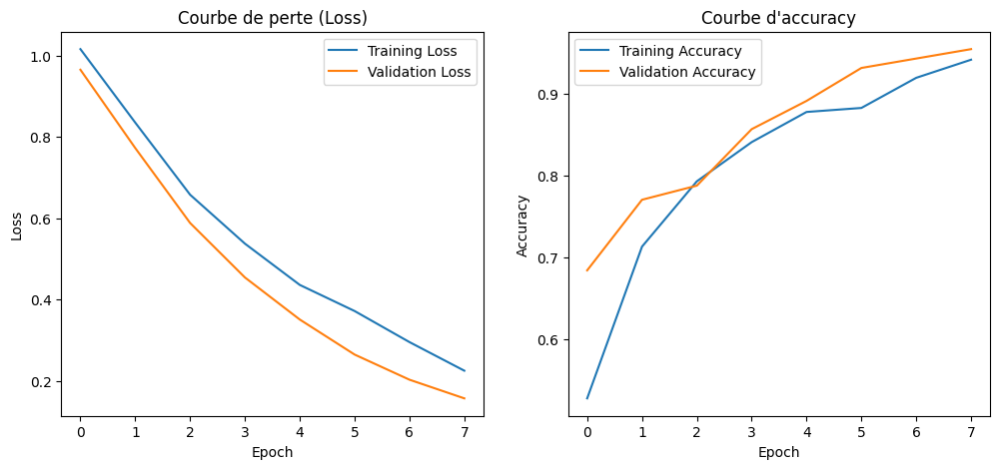


 Temps total d'entraînement: 7269.77 secondes (121.16 minutes)

 Accuracy globale du modèle : 92.05%

 Accuracy par classe :
  Classe 0: 100.00%
  Classe 1: 91.94%
  Classe 2: 86.36%


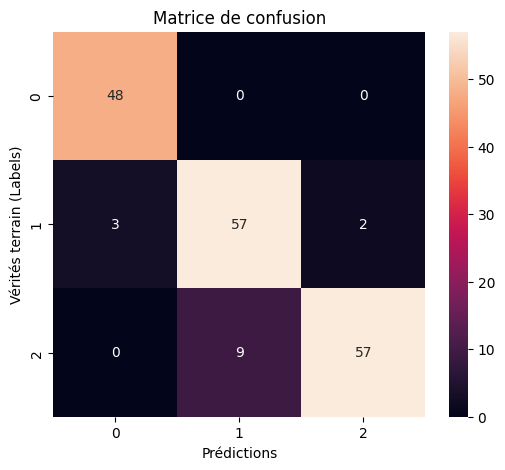


 Rapport de classification :

              precision    recall  f1-score   support

           0       0.94      1.00      0.97        48
           1       0.86      0.92      0.89        62
           2       0.97      0.86      0.91        66

    accuracy                           0.92       176
   macro avg       0.92      0.93      0.92       176
weighted avg       0.92      0.92      0.92       176


 Résultat sauvegardé dans : /content/drive/MyDrive/projet /stattistic_resultats.csv

 Nouvelle entrée ajoutée :
                 model_name  accuracy  training_time
model_efficientnet_b7_l8_72    0.9205        7269.77


np.float64(0.9204545454545454)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models

# -------------------------------
#  Charger EfficientNet-B7 pré-entraîné
# -------------------------------
model_efficientnet_b7_l8_72 = models.efficientnet_b7(weights=models.EfficientNet_B7_Weights.IMAGENET1K_V1)

# Geler toutes les couches
for param in model_efficientnet_b7_l8_72.parameters():
    param.requires_grad = False

# Remplacer la dernière couche classifier pour 3 classes
num_classes = 3
in_features = model_efficientnet_b7_l8_72.classifier[1].in_features
model_efficientnet_b7_l8_72.classifier[1] = nn.Linear(in_features, num_classes)

# -------------------------------
# Dégeler les couches spécifiques
# -------------------------------

# Dégeler le bloc features[8]
for param in model_efficientnet_b7_l8_72.features[8].parameters():
    param.requires_grad = True

# Dégeler le sous-bloc features[7][2]
for param in model_efficientnet_b7_l8_72.features[7][2].parameters():
    param.requires_grad = True

# -------------------------------
# Définir le device, loss et optimiseur
# -------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_efficientnet_b7_l8_72 = model_efficientnet_b7_l8_72.to(device)

criterion = nn.CrossEntropyLoss()

# Optimiseur pour toutes les couches dégelées
params_to_optimize = filter(lambda p: p.requires_grad, model_efficientnet_b7_l8_72.parameters())
optimizer = optim.Adam(params_to_optimize, lr=0.0001)

# -------------------------------
# Vérifier les couches dégelées
# -------------------------------
for name, param in model_efficientnet_b7_l8_72.named_parameters():
    if param.requires_grad:
        print(name)

# -------------------------------
#  Afficher le modèle
# -------------------------------
print(model_efficientnet_b7_l8_72)


# -------------------------------
# Entraîner le modèle
# -------------------------------
# Réduit le learning rate si la validation loss stagne
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2
)

model, history ,training_time  = train_model(
    model_efficientnet_b7_l8_72,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    device,
    num_epochs=8,
    scheduler=scheduler,
    early_stopping=True,
    patience=3,
    checkpoint_path="/content/drive/MyDrive/projet /model_efficientnet_b7_l8_72.pt"


)

# -------------------------------
# Évaluer le modèle
# -------------------------------

evaluate_model(
    model_efficientnet_b7_l8_72,
    test_loader,
    device,
    class_names=class_names,
    show_class_report=True,
    training_time=training_time,
    model_name='model_efficientnet_b7_l8_72'

)



Le dégel partiel des blocs profonds d’EfficientNet-B7 n’a pas permis d’améliorer les performances globales, l’exactitude chutant à environ 92 %.

Bien que la classe “Occupée” soit parfaitement reconnue (100 %),

les classes “Libre” et surtout “Libre interdite” (86 %) ont subi une légère baisse de précision.

En visualisant la courbe d'apprentissage , on remarque que le modèle ne surapprend pas encore, ce qui infirme notre hypothèse précédemment formulée.

Peut être qu'on pourra  adopté une stratégie de fine-tuning plus progressive ou un apprentissage sur davantage d’époques.

Cependant , Nous allons explorer d'autres modèles et revenir sur celui -ci après.

## III - Modèle basé sur EfficientNet-B6

Downloading: "https://download.pytorch.org/models/efficientnet_b6_lukemelas-24a108a5.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b6_lukemelas-24a108a5.pth


100%|██████████| 165M/165M [00:01<00:00, 153MB/s]


classifier.1.weight
classifier.1.bias
EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 56, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(56, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(56, 56, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=56, bias=False)
            (1): BatchNorm2d(56, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(56, 14, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(14, 56, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
  

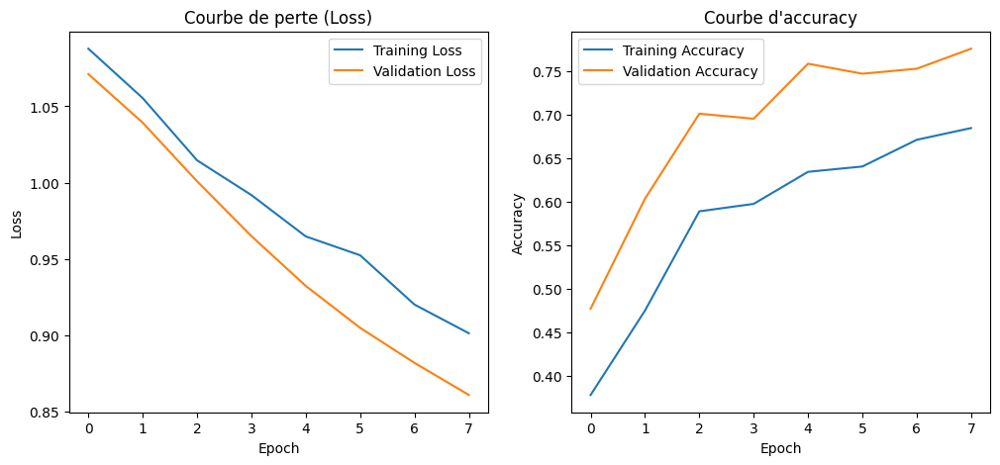


 Temps total d'entraînement: 6921.49 secondes (115.36 minutes)

 Accuracy globale du modèle : 77.27%

 Accuracy par classe :
  Classe 0: 97.92%
  Classe 1: 69.35%
  Classe 2: 69.70%


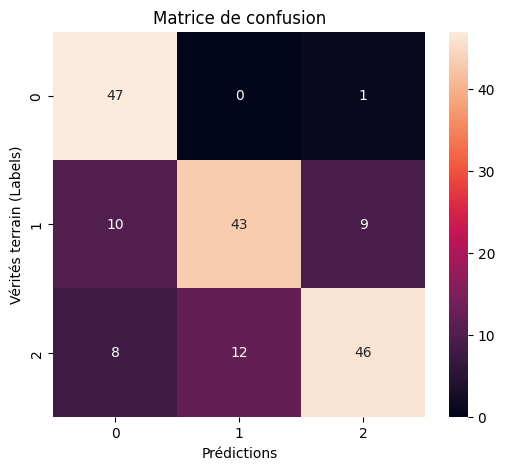


 Rapport de classification :

              precision    recall  f1-score   support

           0       0.72      0.98      0.83        48
           1       0.78      0.69      0.74        62
           2       0.82      0.70      0.75        66

    accuracy                           0.77       176
   macro avg       0.78      0.79      0.77       176
weighted avg       0.78      0.77      0.77       176


 Résultat sauvegardé dans : /content/drive/MyDrive/projet /stattistic_resultats.csv

 Nouvelle entrée ajoutée :
           model_name  accuracy  training_time
model_efficientnet_b6    0.7727        6921.49


np.float64(0.7727272727272727)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models

# -------------------------------
# Charger EfficientNet-B6 pré-entraîné sur ImageNet
# -------------------------------
model_efficientnet_b6 = models.efficientnet_b6(weights=models.EfficientNet_B6_Weights.IMAGENET1K_V1)

# Geler toutes les couches
for param in model_efficientnet_b6.parameters():
    param.requires_grad = False

# Remplacer la dernière couche classifier pour 3 classes
num_classes = 3
in_features = model_efficientnet_b6.classifier[1].in_features
model_efficientnet_b6.classifier[1] = nn.Linear(in_features, num_classes)

# Dégeler uniquement la dernière couche classifier[1]
for param in model_efficientnet_b6.classifier[1].parameters():
    param.requires_grad = True

# -------------------------------
# Définir le device, loss et optimiseur
# -------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_efficientnet_b6 = model_efficientnet_b6.to(device)

criterion = nn.CrossEntropyLoss()

# Optimiseur pour la dernière couche uniquement
params_to_optimize = filter(lambda p: p.requires_grad, model_efficientnet_b6.parameters())
optimizer = optim.Adam(params_to_optimize, lr=0.0001)

# -------------------------------
# Vérifier les couches dégelées
# -------------------------------
for name, param in model_efficientnet_b6.named_parameters():
    if param.requires_grad:
        print(name)

# -------------------------------
#  Afficher le modèle
# -------------------------------
print(model_efficientnet_b6)



# -------------------------------
# Entraîner le modèle
# -------------------------------
# Réduit le learning rate si la validation loss stagne
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2
)

model, history ,training_time  = train_model(
    model_efficientnet_b6,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    device,
    num_epochs=8,
    scheduler=scheduler,
    early_stopping=True,
    patience=3,
    checkpoint_path="/content/drive/MyDrive/projet /model_efficientnet_b6.pt"


)

# -------------------------------
# Évaluer le modèle
# -------------------------------

evaluate_model(
    model_efficientnet_b6,
    test_loader,
    device,
    class_names=class_names,
    show_class_report=True,
    training_time=training_time,
    model_name='model_efficientnet_b6'

)



Le modèle EfficientNet-B6, avec uniquement la couche de classification , montre une bonne performance pour la classe "Occupée" (97.9 %), mais échoue à bien généraliser sur les classes "Libre" (69.3 %) et "Libre interdite" (69.7 %).

Le gel complet du réseau empêche l’adaptation des représentations internes aux spécificités visuelles du jeu de données.

La couche finale seule n'est pas suffisant pour compenser les variations comme celles d’éclairage, d’angle et de texture propres aux classes non occupées.



# Partie 4+ (expérience)  Learning transfert + augmentation

Dans cette partie, nous allons developper des expériences particulières en associant, le learning transfert et data augmentation

Nous allons donc refaire les transformations des alternatives en utilisant les données statistiques de ImageNet. (Nos fonctions serviront ici pour éviter la duplication du code).

Total images: 1165 -> Train: 815, Val: 174, Test: 176

 Dataset chargé avec succès depuis : /content/drive/MyDrive/projet /images_V2
 Classes détectées : ['0', '1', '2']


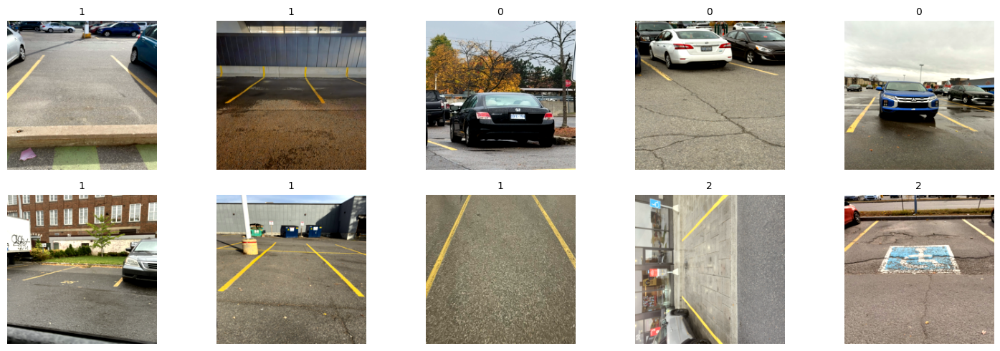

Total images: 1165 -> Train: 815, Val: 174, Test: 176

 Dataset chargé avec succès depuis : /content/drive/MyDrive/projet /images_V2
 Classes détectées : ['0', '1', '2']


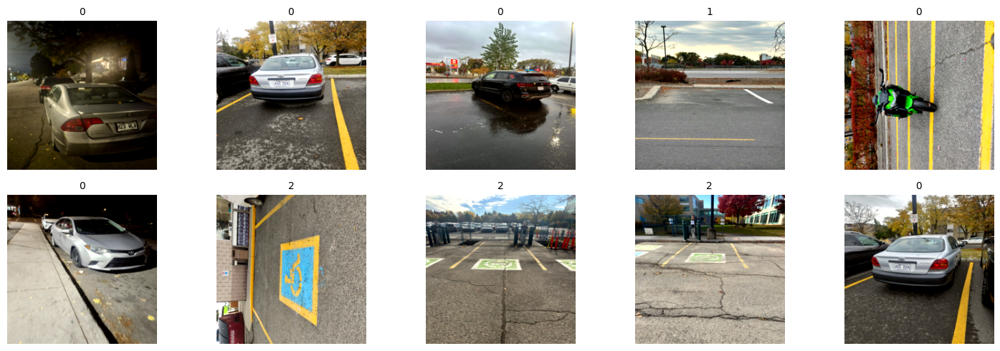

Total images: 1165 -> Train: 815, Val: 174, Test: 176

 Dataset chargé avec succès depuis : /content/drive/MyDrive/projet /images_V2
 Classes détectées : ['0', '1', '2']


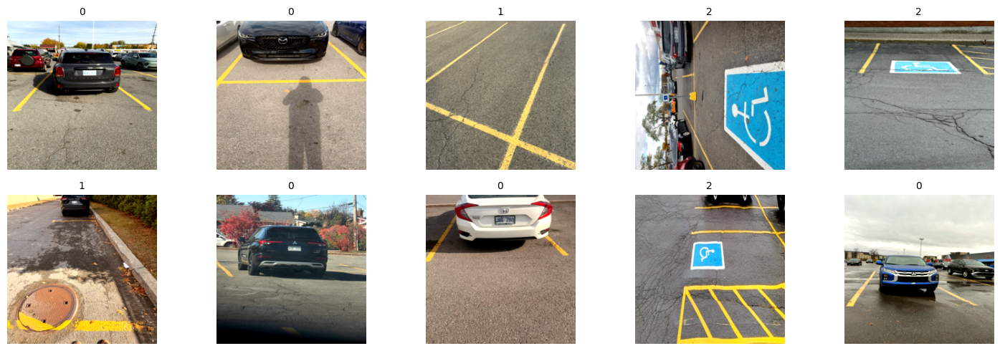

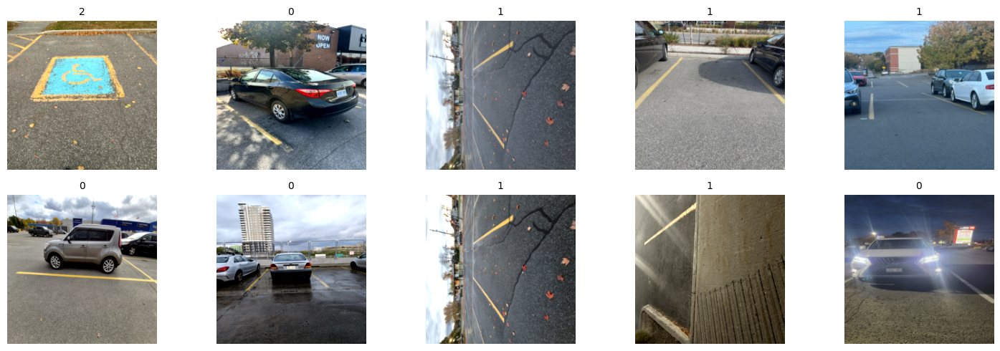

Total images: 1165 -> Train: 815, Val: 174, Test: 176

 Dataset chargé avec succès depuis : /content/drive/MyDrive/projet /images_V2
 Classes détectées : ['0', '1', '2']
Total images: 1165 -> Train: 815, Val: 174, Test: 176

 Dataset chargé avec succès depuis : /content/drive/MyDrive/projet /images_V2
 Classes détectées : ['0', '1', '2']
Total images: 1165 -> Train: 815, Val: 174, Test: 176

 Dataset chargé avec succès depuis : /content/drive/MyDrive/projet /images_V2
 Classes détectées : ['0', '1', '2']


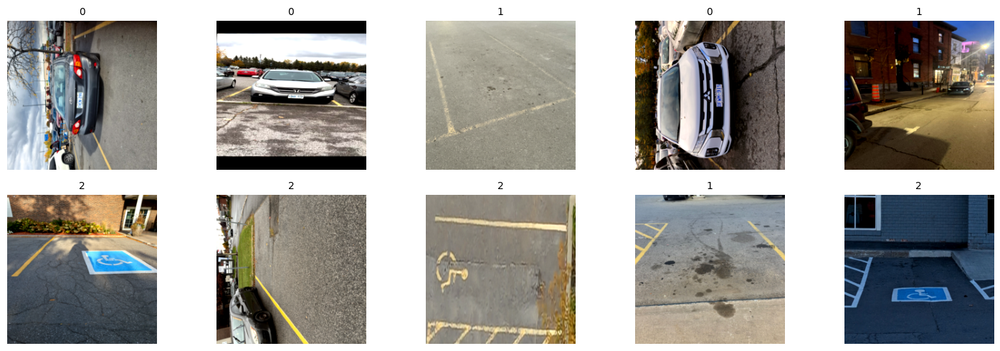

In [ ]:


train_dataset_alt1,val_dataset,test_dataset, train_loader_alt1, val_loader, test_loader = augmentation_alt1(mean_norm=[0.485, 0.456, 0.406],
                                                                                                               std_norm=[0.229, 0.224, 0.225])

train_dataset_alt2, train_loader_alt2=augmentation_alt2(mean_norm=[0.485, 0.456, 0.406], std_norm=[0.229, 0.224, 0.225])

train_dataset_alt3, train_loader_alt3=augmentation_alt3(mean_norm=[0.485, 0.456, 0.406], std_norm=[0.229, 0.224, 0.225])

train_dataset_combined_alt4, train_loader_combined_alt4=augmentation_alt4()

train_dataset_combined_alt5, train_loader_combined_alt5=augmentation_alt5(mean_norm=[0.485, 0.456, 0.406], std_norm=[0.229, 0.224, 0.225])



## I - Modèle basé sur EfficientNet-B6 + augmentation alt 4

classifier.1.weight
classifier.1.bias
EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 56, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(56, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(56, 56, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=56, bias=False)
            (1): BatchNorm2d(56, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(56, 14, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(14, 56, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
  

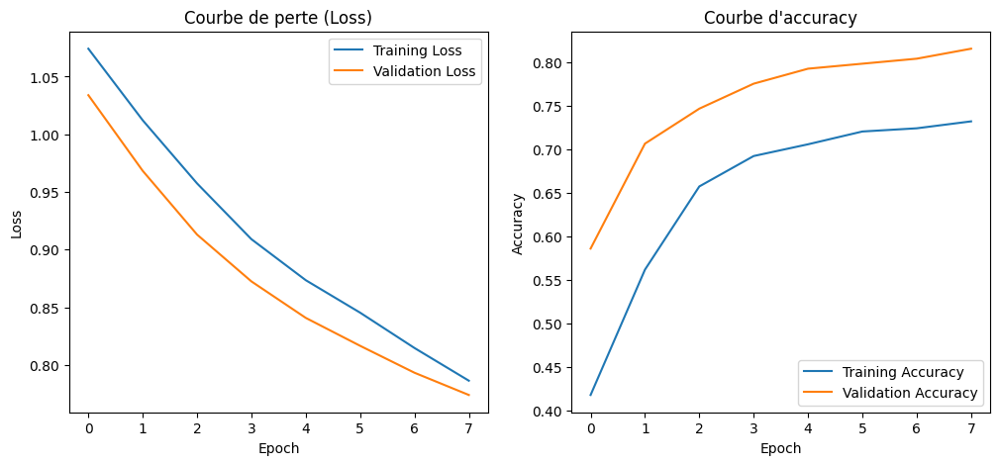


 Temps total d'entraînement: 11002.15 secondes (183.37 minutes)

 Accuracy globale du modèle : 71.59%

 Accuracy par classe :
  Classe 0: 100.00%
  Classe 1: 61.29%
  Classe 2: 60.61%


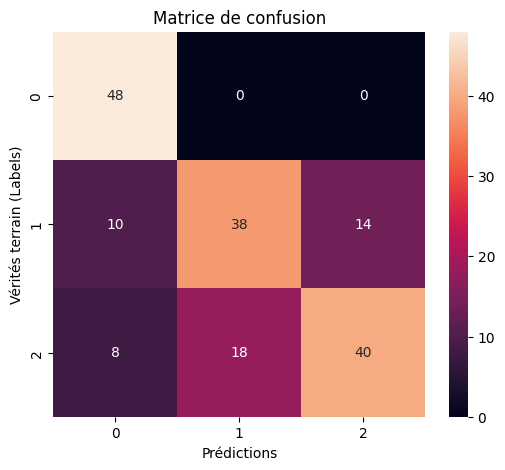


 Rapport de classification :

              precision    recall  f1-score   support

           0       0.73      1.00      0.84        48
           1       0.68      0.61      0.64        62
           2       0.74      0.61      0.67        66

    accuracy                           0.72       176
   macro avg       0.72      0.74      0.72       176
weighted avg       0.72      0.72      0.71       176


 Résultat sauvegardé dans : /content/drive/MyDrive/projet /stattistic_resultats.csv

 Nouvelle entrée ajoutée :
                model_name  accuracy  training_time
model_efficientnet_b6_alt4    0.7159       11002.15


np.float64(0.7159090909090909)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models

# -------------------------------
# Charger EfficientNet-B6 pré-entraîné sur ImageNet
# -------------------------------
model_efficientnet_b6_alt4 = models.efficientnet_b6(weights=models.EfficientNet_B6_Weights.IMAGENET1K_V1)

# Geler toutes les couches
for param in model_efficientnet_b6_alt4.parameters():
    param.requires_grad = False

# Remplacer la dernière couche classifier pour 3 classes
num_classes = 3
in_features = model_efficientnet_b6_alt4.classifier[1].in_features
model_efficientnet_b6_alt4.classifier[1] = nn.Linear(in_features, num_classes)

# Dégeler uniquement la dernière couche classifier[1]
for param in model_efficientnet_b6_alt4.classifier[1].parameters():
    param.requires_grad = True

# -------------------------------
# Définir le device, loss et optimiseur
# -------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_efficientnet_b6_alt4 = model_efficientnet_b6_alt4.to(device)

criterion = nn.CrossEntropyLoss()

# Optimiseur pour la dernière couche uniquement
params_to_optimize = filter(lambda p: p.requires_grad, model_efficientnet_b6_alt4.parameters())
optimizer = optim.Adam(params_to_optimize, lr=0.0001)

# -------------------------------
# Vérifier les couches dégelées
# -------------------------------
for name, param in model_efficientnet_b6_alt4.named_parameters():
    if param.requires_grad:
        print(name)

# -------------------------------
#  Afficher le modèle
# -------------------------------
print(model_efficientnet_b6_alt4)



# -------------------------------
# Entraîner le modèle
# -------------------------------
# Réduit le learning rate si la validation loss stagne
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2
)

model, history ,training_time  = train_model(
    model_efficientnet_b6_alt4,
    train_loader_combined_alt4,
    val_loader,
    criterion,
    optimizer,
    device,
    num_epochs=8,
    scheduler=scheduler,
    early_stopping=True,
    patience=3,
    checkpoint_path="/content/drive/MyDrive/projet /model_efficientnet_b6_alt4.pt"


)

# -------------------------------
# Évaluer le modèle
# -------------------------------

evaluate_model(
    model_efficientnet_b6_alt4,
    test_loader,
    device,
    class_names=class_names,
    show_class_report=True,
    training_time=training_time,
    model_name='model_efficientnet_b6_alt4'

)



L’EfficientNet-B6, entraîné avec les données augmentées Alt4 (combinaison de jeux enrichis) mais avec seulement la couche finale déglée, obtient une accuracy globale faible (71.6 %), malgré une excellente reconnaissance de la classe “Occupée” (100 %).

Le modèle reste trop rigide, car le gel complet du backbone ne lui permet pas d’exploiter pleinement la richesse des données Alt4.

Les classes “Libre” et “Libre interdite” sont mal différenciées , probablement à cause d’une confusion visuelle accrue par les variations introduites par les augmentations.

Hypothèse: Le problème rencontré par le EfficientNet-B6, n'est pas liée aux données mais plutôt à l'architecture du modèle utilisé pour l'entrainnement

Nous allons utilisé une autre augmentation, pour confirmer ou infirmer cette hypothèse.

## II - Modèle basé sur EfficientNet-B6 + augmentation alt 5

Downloading: "https://download.pytorch.org/models/efficientnet_b6_lukemelas-24a108a5.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b6_lukemelas-24a108a5.pth


100%|██████████| 165M/165M [00:04<00:00, 39.8MB/s]


classifier.1.weight
classifier.1.bias
EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 56, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(56, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(56, 56, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=56, bias=False)
            (1): BatchNorm2d(56, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(56, 14, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(14, 56, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
  

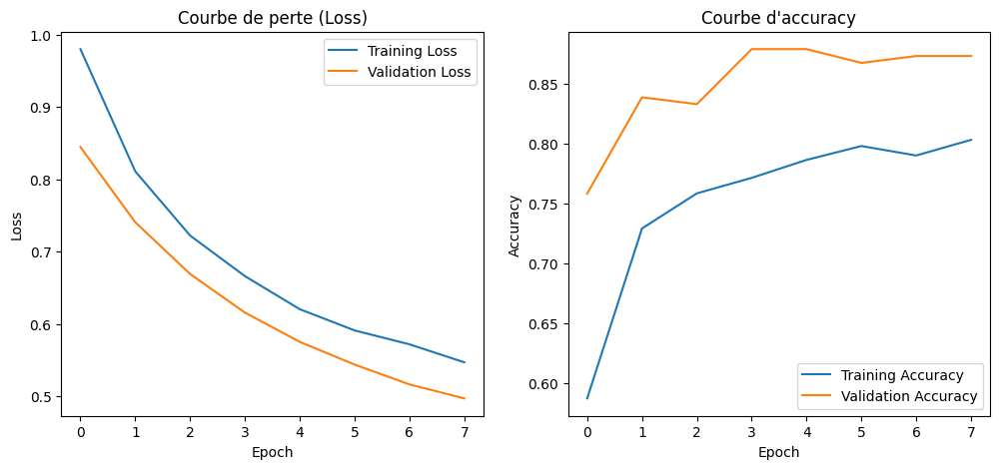


 Temps total d'entraînement: 35240.44 secondes (587.34 minutes)

 Accuracy globale du modèle : 83.52%

 Accuracy par classe :
  Classe 0: 100.00%
  Classe 1: 82.26%
  Classe 2: 72.73%


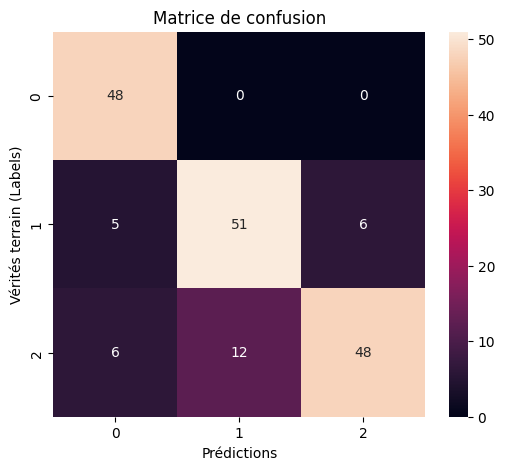


 Rapport de classification :

              precision    recall  f1-score   support

           0       0.81      1.00      0.90        48
           1       0.81      0.82      0.82        62
           2       0.89      0.73      0.80        66

    accuracy                           0.84       176
   macro avg       0.84      0.85      0.84       176
weighted avg       0.84      0.84      0.83       176


 Résultat sauvegardé dans : /content/drive/MyDrive/projet /stattistic_resultats.csv

 Nouvelle entrée ajoutée :
                model_name  accuracy  training_time
model_efficientnet_b6_alt5    0.8352       35240.44


np.float64(0.8352272727272727)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models

# -------------------------------
# Charger EfficientNet-B6 pré-entraîné sur ImageNet
# -------------------------------
model_efficientnet_b6_alt5 = models.efficientnet_b6(weights=models.EfficientNet_B6_Weights.IMAGENET1K_V1)

# Geler toutes les couches
for param in model_efficientnet_b6_alt5.parameters():
    param.requires_grad = False

# Remplacer la dernière couche classifier pour 3 classes
num_classes = 3
in_features = model_efficientnet_b6_alt5.classifier[1].in_features
model_efficientnet_b6_alt5.classifier[1] = nn.Linear(in_features, num_classes)

# Dégeler uniquement la dernière couche classifier[1]
for param in model_efficientnet_b6_alt5.classifier[1].parameters():
    param.requires_grad = True

# -------------------------------
# Définir le device, loss et optimiseur
# -------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_efficientnet_b6_alt5 = model_efficientnet_b6_alt5.to(device)

criterion = nn.CrossEntropyLoss()

# Optimiseur pour la dernière couche uniquement
params_to_optimize = filter(lambda p: p.requires_grad, model_efficientnet_b6_alt5.parameters())
optimizer = optim.Adam(params_to_optimize, lr=0.0001)

# -------------------------------
# Vérifier les couches dégelées
# -------------------------------
for name, param in model_efficientnet_b6_alt5.named_parameters():
    if param.requires_grad:
        print(name)

# -------------------------------
#  Afficher le modèle
# -------------------------------
print(model_efficientnet_b6_alt5)



# -------------------------------
# Entraîner le modèle
# -------------------------------
# Réduit le learning rate si la validation loss stagne
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2
)

model, history ,training_time  = train_model(
    model_efficientnet_b6_alt5,
    train_loader_combined_alt5,
    val_loader,
    criterion,
    optimizer,
    device,
    num_epochs=8,
    scheduler=scheduler,
    early_stopping=True,
    patience=3,
    checkpoint_path="/content/drive/MyDrive/projet /model_efficientnet_b6_alt5.pt"


)

# -------------------------------
# Évaluer le modèle
# -------------------------------

evaluate_model(
    model_efficientnet_b6_alt5,
    test_loader,
    device,
    class_names=class_names,
    show_class_report=True,
    training_time=training_time,
    model_name='model_efficientnet_b6_alt5'

)



L’EfficientNet-B6, entraîné avec le jeu de données enrichi Alt5, montre une progression nette des performances avec une accuracy globale de 83.5 %, soit +12 points par rapport à la version Alt4.


La classe 0 (“Occupée”) reste parfaitement reconnue (100 %), confirmant une excellente sensibilité sur cette catégorie.

Les classes 1 et 2 progressent nettement, traduisant une meilleure généralisation du modèle face à la diversité d’images introduite par Alt5.

Le fait de ne dégeler que la dernière couche limite encore l’adaptation profonde du réseau, mais les données Alt5 semblent plus équilibrées et cohérentes que celles d’Alt4.

Celà infirme partiellement notre hypothèse posée  dans la section précédente. La richesse des données aussi est important pas seulement la profondeur du modèle



## III - Modèle basé sur model_efficientnet_b7_l8_72 + augmentation alt 5

##### ***- Dernière couche degelée (fc) et la couche 8 et 7.2***

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models

# -------------------------------
#  Charger EfficientNet-B7 pré-entraîné
# -------------------------------
model_efficientnet_b7_l8_72_alt5 = models.efficientnet_b7(weights=models.EfficientNet_B7_Weights.IMAGENET1K_V1)

# Geler toutes les couches
for param in model_efficientnet_b7_l8_72_alt5.parameters():
    param.requires_grad = False

# Remplacer la dernière couche classifier pour 3 classes
num_classes = 3
in_features = model_efficientnet_b7_l8_72_alt5.classifier[1].in_features
model_efficientnet_b7_l8_72_alt5.classifier[1] = nn.Linear(in_features, num_classes)

# -------------------------------
# Dégeler les couches spécifiques
# -------------------------------

# Dégeler le bloc features[8]
for param in model_efficientnet_b7_l8_72_alt5.features[8].parameters():
    param.requires_grad = True

# Dégeler le sous-bloc features[7][2]
for param in model_efficientnet_b7_l8_72_alt5.features[7][2].parameters():
    param.requires_grad = True

# -------------------------------
# Définir le device, loss et optimiseur
# -------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_efficientnet_b7_l8_72_alt5 = model_efficientnet_b7_l8_72_alt5.to(device)

criterion = nn.CrossEntropyLoss()

# Optimiseur pour toutes les couches dégelées
params_to_optimize = filter(lambda p: p.requires_grad, model_efficientnet_b7_l8_72_alt5.parameters())
optimizer = optim.Adam(params_to_optimize, lr=0.0001)

# -------------------------------
# Vérifier les couches dégelées
# -------------------------------
for name, param in model_efficientnet_b7_l8_72_alt5.named_parameters():
    if param.requires_grad:
        print(name)

# -------------------------------
#  Afficher le modèle
# -------------------------------
print(model_efficientnet_b7_l8_72_alt5)



# -------------------------------
# Entraîner le modèle
# -------------------------------
# Réduit le learning rate si la validation loss stagne
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2
)

model, history ,training_time  = train_model(
    model_efficientnet_b7_l8_72_alt5,
    train_loader_combined_alt5,
    val_loader,
    criterion,
    optimizer,
    device,
    num_epochs=12,
    scheduler=scheduler,
    early_stopping=True,
    patience=3,
    checkpoint_path="/content/drive/MyDrive/projet /model_efficientnet_b7_l8_72_alt5.pt"


)




Downloading: "https://download.pytorch.org/models/efficientnet_b7_lukemelas-c5b4e57e.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b7_lukemelas-c5b4e57e.pth


100%|██████████| 255M/255M [00:05<00:00, 50.8MB/s]


features.7.2.block.0.0.weight
features.7.2.block.0.1.weight
features.7.2.block.0.1.bias
features.7.2.block.1.0.weight
features.7.2.block.1.1.weight
features.7.2.block.1.1.bias
features.7.2.block.2.fc1.weight
features.7.2.block.2.fc1.bias
features.7.2.block.2.fc2.weight
features.7.2.block.2.fc2.bias
features.7.2.block.3.0.weight
features.7.2.block.3.1.weight
features.7.2.block.3.1.bias
features.8.0.weight
features.8.1.weight
features.8.1.bias
classifier.1.weight
classifier.1.bias
EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
            (1): 

features.7.2.block.0.0.weight
features.7.2.block.0.1.weight
features.7.2.block.0.1.bias
features.7.2.block.1.0.weight
features.7.2.block.1.1.weight
features.7.2.block.1.1.bias
features.7.2.block.2.fc1.weight
features.7.2.block.2.fc1.bias
features.7.2.block.2.fc2.weight
features.7.2.block.2.fc2.bias
features.7.2.block.3.0.weight
features.7.2.block.3.1.weight
features.7.2.block.3.1.bias
features.8.0.weight
features.8.1.weight
features.8.1.bias
classifier.1.weight
classifier.1.bias
EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
            (1): 

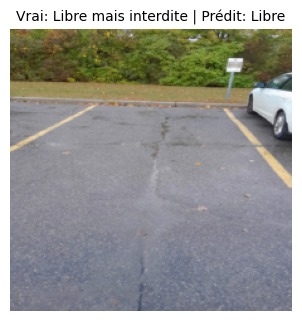


 Accuracy globale du modèle : 99.43%

 Accuracy par classe :
  Classe Occupée: 100.00%
  Classe Libre: 100.00%
  Classe Libre mais interdite: 97.87%


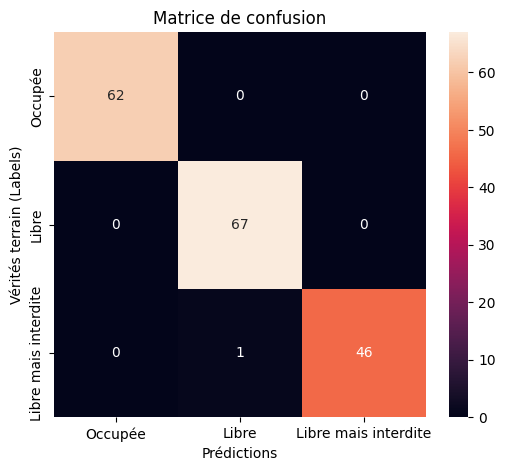


 Rapport de classification :

                      precision    recall  f1-score   support

             Occupée       1.00      1.00      1.00        62
               Libre       0.99      1.00      0.99        67
Libre mais interdite       1.00      0.98      0.99        47

            accuracy                           0.99       176
           macro avg       1.00      0.99      0.99       176
        weighted avg       0.99      0.99      0.99       176


 Résultat sauvegardé dans : /content/drive/MyDrive/projet /stattistic_resultats.csv

 Nouvelle entrée ajoutée :
                      model_name  accuracy  training_time
model_efficientnet_b7_l8_72_alt5    0.9943    522220222.0


(np.float64(0.9943181818181818),
    index  true_label  predicted_label       true_label_name  \
 0     30           2                1  Libre mais interdite   
 
   predicted_label_name                                              image  
 0                Libre  [[[tensor(-0.3027), tensor(-0.4568), tensor(-0...  )

In [ ]:
# -------------------------------xxx
#  Charger EfficientNet-B7 pré-entraîné
# -------------------------------
model_efficientnet_b7_l8_72_alt5 = models.efficientnet_b7(weights=models.EfficientNet_B7_Weights.IMAGENET1K_V1)

# Geler toutes les couches
for param in model_efficientnet_b7_l8_72_alt5.parameters():
    param.requires_grad = False

# Remplacer la dernière couche classifier pour 3 classes
num_classes = 3
in_features = model_efficientnet_b7_l8_72_alt5.classifier[1].in_features
model_efficientnet_b7_l8_72_alt5.classifier[1] = nn.Linear(in_features, num_classes)

# -------------------------------
# Dégeler les couches spécifiques
# -------------------------------

# Dégeler le bloc features[8]
for param in model_efficientnet_b7_l8_72_alt5.features[8].parameters():
    param.requires_grad = True

# Dégeler le sous-bloc features[7][2]
for param in model_efficientnet_b7_l8_72_alt5.features[7][2].parameters():
    param.requires_grad = True

# -------------------------------
# Définir le device, loss et optimiseur
# -------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_efficientnet_b7_l8_72_alt5 = model_efficientnet_b7_l8_72_alt5.to(device)

criterion = nn.CrossEntropyLoss()

# Optimiseur pour toutes les couches dégelées
params_to_optimize = filter(lambda p: p.requires_grad, model_efficientnet_b7_l8_72_alt5.parameters())
optimizer = optim.Adam(params_to_optimize, lr=0.0001)

# -------------------------------
# Vérifier les couches dégelées
# -------------------------------
for name, param in model_efficientnet_b7_l8_72_alt5.named_parameters():
    if param.requires_grad:
        print(name)

# -------------------------------
#  Afficher le modèle
# -------------------------------
print(model_efficientnet_b7_l8_72_alt5)


# Charger tes poids sauvegardés
model_efficientnet_b7_l8_72_alt5.load_state_dict(torch.load("/content/drive/MyDrive/projet /model_efficientnet_b7_l8_72_alt5.pt"))

# -------------------------------
# Évaluer le modèle
# -------------------------------

evaluate_model(
    model_efficientnet_b7_l8_72_alt5,
    test_loader,
    device,
    class_names=class_names,
    show_class_report=True,
    training_time=522220222,
    error_exam=True,
    model_name='model_efficientnet_b7_l8_72_alt5'

)


In [ ]:
print("Nombre de batches :", len(train_loader_combined_alt5))
print("Taille du dataset :", len(train_loader_combined_alt5.dataset))
print("Taille d’un batch :", train_loader_combined_alt5.batch_size)


Nombre de batches : 230
Taille du dataset : 7335
Taille d’un batch : 32


L’EfficientNet-B7 ajusté avec le jeu Alt5 atteint une précision exceptionnelle de 99,43 %, signe d’un bon apprentissage et d’une généralisation  stable.

Les classes “Occupée” et “Libre” : parfaitement reconnues (100 % chacune).

La classe “Libre mais interdite” : légèrement en dessous (97,9 %), ce qui reste excellent.

Le dégel ciblé du bloc 8 et du sous-bloc 7.2 a permis d’ajuster finement les caractéristiques de haut niveau, renforçant la sensibilité du modèle sans provoquer de sur-apprentissage.

L’utilisation du dataset Alt5, plus équilibré et riche, a joué un rôle majeur dans la montée de performance. Avec toutes réseaux de neurone, le modèle a eu la quantité suffissante de données pour apprendre sans surapprendre





####  **Analyse des Échecs**


Le modèle a bien performer mais il a eu une erreur, comme le montre l'image affichée dans la partie évaluation du modèle

Le modèle a mal assigné l'image à une classe. Probablement à cause de la position du panneau. Il a peut être identifié correctement le panneau mais ne l'a pas associé à l'emplacement visé , alors que c'est le cas. En effet le panneau indiquait des interdictions spécifiques sur certaines places (numéro 4 et 7) dans le parking, qui sont des places de parking interdit. Il faudra que le modèle arrive à lire ou déchiffrer ces informations sur le panneau pour comprendre cette réalité. Ce qui sera complexe.




####  **Meilleur modèle**

model_efficientnet_b7_l8_72_alt5 est considéré comme le meilleur modèle en se basant sur l'exactitude obtenue. En effet l’EfficientNet-B7 entraîné avec le dataset Alt5 obtient les meilleures performances (≈99.43%) parce que l’architecture B7 possède une très grande capacité d’extraction de détails, particulièrement utile pour reconnaître les variations fines entre “occupée”, “libre” et “libre mais interdite”. Le dataset Alt5, mieux nettoyé, plus riches et mieux équilibré que les versions précédentes, fournit au modèle des exemples plus cohérents et donc plus faciles à apprendre. Le fine-tuning ciblé des derniers blocs (features[8] et features[7][2]) permet d’adapter précisément le modèle sans perturber les représentations générales apprises sur ImageNet. Le compromis crée par ces techniques jumulées a permis d'obtenir une hausse de performance.

En contrepartie, EfficientNet-B7 a été très coûteux : il a nécessité un temps d’entraînement nettement plus long et davantage de mémoire. De plus, les transformations Alt5 augmentent la complexité du prétraitement, ce qui rallonge encore le pipeline d’entraînement.

Il sera donc limiter ou difficile de le déployer en production sur du matériel limité.

En formulant l'hypothèse que les ressources sont suffissantes pour le déploiement et que le modèle ne sera pas réentrainner régulièrement,model_efficientnet_b7_l8_72_alt5 est le choix idéal.

Cependant le modèle ResNet152_l4 qui offre une performance de presque 94% sur un le jeu de donnée  sans augmentation est également une meilleure option. En effet il offre un meilleur compromis entre performance, temps d'entrainement, ainsi que les besoins en ressources.


# Partie 5  Analyse comparative et conclusion

## I - Tableau Comparatif

In [1]:
import matplotlib.pyplot as plt

def plot_model_stats(df):
    """
    Pour afficher deux graphiques matplotlib : accuracy et temps d'entraînement par modèle.
    """
    #  Graphique 1 : Accuracy
    plt.figure(figsize=(15, 11))
    plt.barh(df["model_name"], df["accuracy"], color="skyblue")
    plt.title("Accuracy par modèle", fontsize=14, fontweight="bold")
    plt.xlabel("Accuracy")
    plt.ylabel("Modèle")
    plt.gca().invert_yaxis()  # Pour que le meilleur modèle soit en haut
    plt.tight_layout()
    plt.show()

    #  Graphique 2 : Temps d'entraînement
    plt.figure(figsize=(20, 15))
    plt.barh(df["model_name"], df["training_time"], color="salmon")
    plt.title("Temps d'entraînement par modèle (secondes)", fontsize=14, fontweight="bold")
    plt.xlabel("Temps (secondes)")
    plt.ylabel("Modèle")
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()


Nous allons importer notre fichier stattistic_resultats_t.csv. Ce fichier contient toutes informations liées à chaque modèle (score et temps d'entrainement).

In [2]:
import pandas as pd


from google.colab import drive
drive.mount('/content/drive')

# 2. Vérifier où est ton fichier
import os

# Liste les fichiers à la racine de ton Drive
print(os.listdir("/content/drive/My Drive"))

# 4. Lire avec pandas (CSV)
import pandas as pd
df_stat = pd.read_csv("/content/drive/MyDrive/projet /stattistic_resultats_t.csv", sep=";")
df_stat.columns = df_stat.iloc[0]

df_stat = df_stat.drop(index=0).reset_index(drop=True)

df_stat=df_stat.sort_values(by=['accuracy'])
df_stat

Mounted at /content/drive
['Document sans titre (2).gdoc', 'Document sans titre (1).gdoc', 'Document sans titre.gdoc', 'Peinture.gdoc', 'Business Plan Professionnel.gdoc', 'projet ', 'Product Backlog bon.docx', 'Colab Notebooks', 'Google AI Studio', 'projet ccn_classic_like_vgg2_alt5.pt']


,model_name,accuracy,training_time
1,ccn_classic_like_vgg,0.3239,8970.46
4,ccn_classic_like_vgg2_alt1,0.6648,1846.21
0,ccn_classic_like_AlexNet,0.6705,3356.41
14,model_efficientnet_b6_alt4,0.7159,11002.15
2,ccn_classic_like_mini_ResNet,0.7216,2347.20
9,model_resnet152,0.7557,6634.33
3,ccn_classic_like_vgg2,0.767,3784.85
13,model_efficientnet_b6,0.7727,6921.49
15,model_efficientnet_b6_alt5,0.8352,35240.44
5,ccn_classic_like_vgg2_alt2,0.858,6039.09


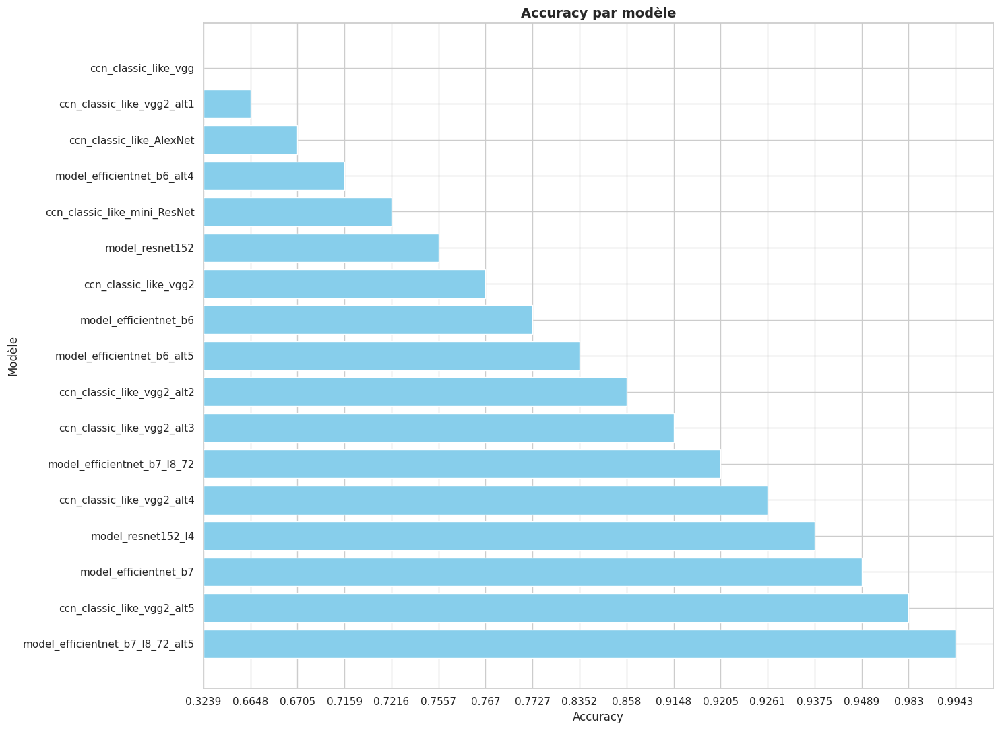

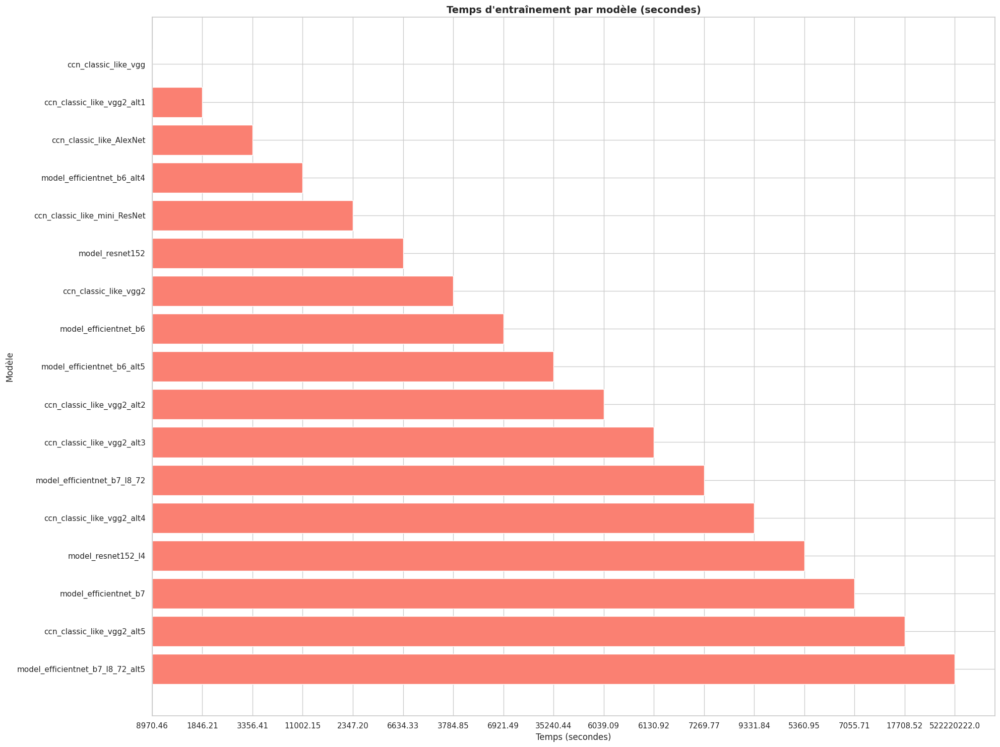

In [ ]:
plot_model_stats(df_stat)

Les résultats montrent une nette supériorité des architectures EfficientNet de quatrième partie, notamment le modèle EfficientNet B7 l8_72_alt5, qui atteint près de 99 % de précision, soit la meilleure performance parmi tous les modèles testés. Cependant, cette excellence s’accompagne d’un temps d’entraînement extrêmement long, ce qui limite son efficacité pratique pour des usages nécessitant la rapidité ou des ressources limitées.

Les variantes ccn_classic_like_vgg2_alt4, ccn_classic_like_vgg2_alt5 et model_resnet152_l4 se distinguent ensuite comme les meilleurs compromis : elles offrent une très bonne accuracy (entre 93 % et 98 %) tout en gardant des temps d’entraînement bien plus raisonnables que les EfficientNet les plus lourds. Elles constituent donc un choix équilibré entre performance et coût computationnel.

À l’inverse, les architectures plus classiques  comme celle basé sur AlexNet ou VGG de la première partie présentent des temps d’entraînement courts, mais leurs précisions restent limitées (souvent sous les 70 %), ce qui les rend moins adaptées à des tâches complexes.


*Conclusion* :  En somme, plus la complexité du modèle augmente, plus la précision progresse, mais au prix d’un coût temporel exponentiel.

## II - Discussion finale

**Quel modèle recommanderiez-vous pour une mise en production ?**

Pour une mise en production, je recommanderais ResNet152 (version finetunée layer4)   plutôt que le model_efficientnet_b7_l8_72_alt5.
Même si EfficientNet-B7 Alt5 affiche la meilleure accuracy, il est beaucoup plus lourd, lent à entraîner, exigeant en mémoire et coûteux à déployer. À l’inverse, ResNet152 offre un excellent compromis :

Accuracy élevée (≈94%), suffisante pour un système opérationnel.

Architecture robuste et stable.

Vitesse d’inférence plus rapide que B7, donc davantage adaptée au temps réel.

Consommation mémoire raisonnable (contrairement à B7 qui peut saturer rapidement un GPU).

Fine-tuning plus simple : les couches sont faciles à manipuler et le comportement du réseau est plus prévisible.

En résumé, model_resnet152_l4 maximise le rapport Exactitude / vitesse / simplicité, ce qui en fait le choix le plus idéal pour un déploiement fiable.


**Principaux défis rencontrés dans ce projet**

Plusieurs défis majeurs sont apparus :

Qualité et homogénéité des images : variations de luminosité, angles, ombres, rotation, contrastes et résolutions rendaient l’apprentissage instable

Construction de datasets alternatifs (Alt1  Alt5) : trouver les bons niveaux de transformations pour éviter d'ajouter plus de bruit ou la perte d’information a été délicat. Neccessité de faire plusieurs tests pour sélectionner les meilleurs.

Fine-tuning complexe de modèles lourds (EfficientNet-B7) : risque de surapprentissage, sensibilité au choix des couches dégelées, long temps d’expérimentation.

Durée d’entraînement élevée : surtout avec EfficientNet-B7, rendant les itérations plus lentes et limitant les tests possibles.





## **Conclusion**

Ce projet nous a permis d'appliquer concrètement les concepts de réseaux de neurones convolutifs, et plus précisément les techniques de classification d’images basées sur des modèles crées à partir de zéro et sur des modèles préentraînés. Il a constitué une excellente opportunité pour nous initier à la conception autonome de modèles de vision, en développant des réflexes essentiels tels que l’anticipation, la gestion des erreurs, ainsi que l'amélioration de nos techniques de recherche à travers l'exploration de multiples sources, notamment les documentations de diverses fonctions, architectures et modules utilisés dans le projet.

Nous remercions sincèrement notre enseignant de nous avoir offert cette opportunité, ainsi que pour le temps et l’énergie considérables qu’il a consacrés à la préparation et à l’encadrement de ce projet.


#### Un sincère Merci. M. Jean Gabriel Gaudreault